# 14. Generative Adversarial Networks
[**Python Deep Learning** Introducción práctica con Keras y TensorFlow 2. Jordi Torres. Editorial Marcombo ISBN: 9788426728289 ](https://www.marcombo.com/python-deep-learning-9788426728289/)

In [2]:
%tensorflow_version 2.x
import tensorflow as tf
from tensorflow import keras
print(tf.__version__)

TensorFlow 2.x selected.
2.1.0-rc1


In [3]:
!nvidia-smi

Mon Jan  6 20:32:16 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.44       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   47C    P0    28W / 250W |      0MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [0]:
import imageio
import matplotlib.pyplot as plt
import numpy as np
import os

In [0]:

(train_images, _), (_, _) = tf.keras.datasets.mnist.load_data()

train_images = train_images.reshape(train_images.shape[0], 28, 28, 1).astype('float32')

train_images = (train_images - 127.5) / 127.5 

BUFFER_SIZE = 60000
BATCH_SIZE = 256
train_dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

## Modelos

### Generador

In [0]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Reshape, Conv2DTranspose, BatchNormalization, LeakyReLU

def make_generator_model():
    model = Sequential()
    model.add(Dense(7*7*256, use_bias=False, input_shape=(100,)))

    model.add(Reshape((7, 7, 256)))

    model.add(Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.01))

    model.add(Conv2DTranspose(64, (5, 5), strides=(1, 1), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.01))

    model.add(Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', activation='tanh'))

    return model



In [7]:
generator = make_generator_model()
generator.summary ()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 12544)             1254400   
_________________________________________________________________
reshape (Reshape)            (None, 7, 7, 256)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 14, 14, 128)       819328    
_________________________________________________________________
batch_normalization (BatchNo (None, 14, 14, 128)       512       
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 14, 14, 128)       0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 14, 14, 64)        204864    
_________________________________________________________________
batch_normalization_1 (Batch (None, 14, 14, 64)        2

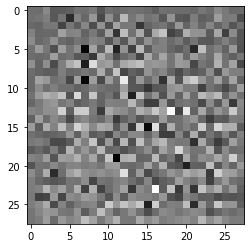

In [8]:
noise_dim = 100
noise = tf.random.normal([1, noise_dim])
generated_image = generator(noise, training=False)

plt.imshow(generated_image[0, :, :, 0], cmap='gray')

### Discriminador

In [0]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Flatten, BatchNormalization, LeakyReLU, Conv2D

def make_discriminator_model():
    model = Sequential()
    model.add(Conv2D(32, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[28, 28, 1]))
    model.add(LeakyReLU(alpha=0.01))
    
    model.add(Conv2D(64, (5, 5), strides=(2, 2), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.01))
    
    model.add(Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.01))

    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))

    return model



In [10]:
discriminator = make_discriminator_model()
decision = discriminator(generated_image)
print (decision)

discriminator.summary ()

tf.Tensor([[0.5006715]], shape=(1, 1), dtype=float32)
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 14, 14, 32)        832       
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 14, 14, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 7, 7, 64)          51264     
_________________________________________________________________
batch_normalization_2 (Batch (None, 7, 7, 64)          256       
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 7, 7, 64)          0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 4, 4, 128)         204928    
_________________________________________________________________


## Funciones de *Loss* y optimizadores


In [0]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

### Discriminator loss

In [0]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

### Generator loss

In [0]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

### Optimizadores

In [0]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)

discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

## Entrenamiento

###Training step



In [0]:
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

### Training loop

In [0]:
import time

grid_size_x= 10
grid_size_y= 10
seed = tf.random.normal([grid_size_x*grid_size_y , noise_dim])

def train(dataset, epochs):
  for epoch in range(epochs):
    start = time.time()

    for image_batch in dataset:
      train_step(image_batch)

    generate_images(generator,seed)
    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

  generate_images(generator, seed)

### Visualización de las imagenes (en realidad solo las que genera el Generador para ver que va aprendiendo)



In [0]:

def generate_images(model, test_input):
  
  predictions = model(test_input, training=False)

  fig = plt.figure(figsize=(grid_size_x,grid_size_y))
  for i in range(predictions.shape[0]):
      plt.subplot(grid_size_x, grid_size_y, i+1)
      plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
      plt.axis('off')            
  plt.show()

### Entrenar el model

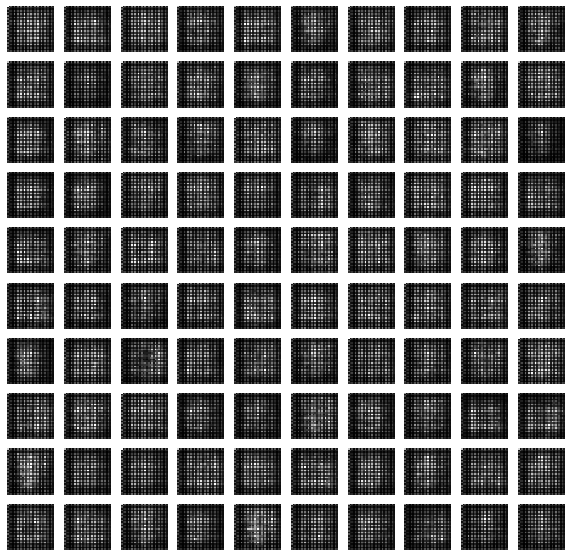

Time for epoch 1 is 12.176724672317505 sec


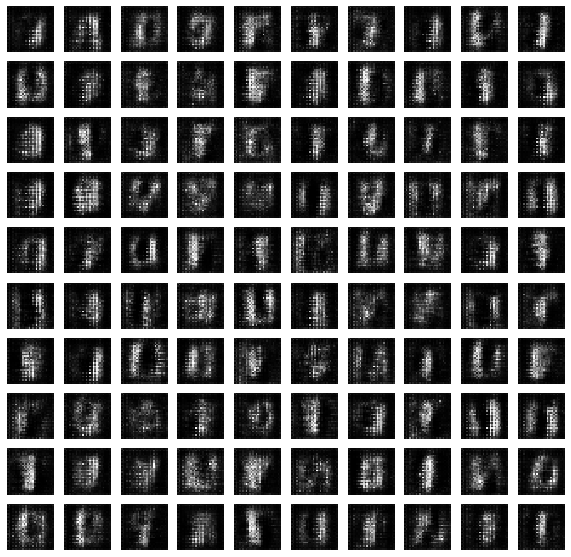

Time for epoch 2 is 9.791322708129883 sec


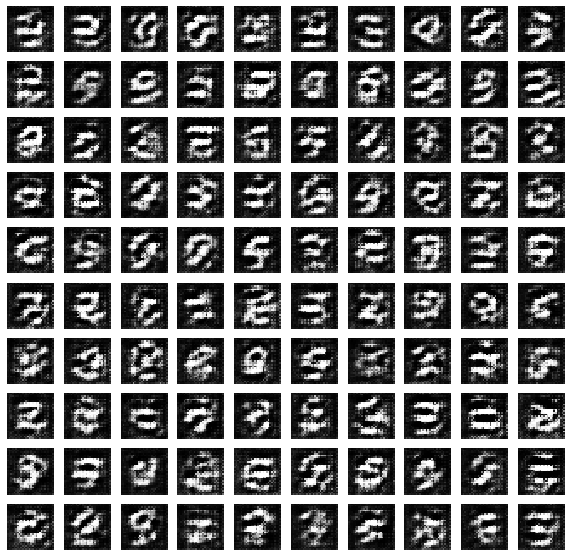

Time for epoch 3 is 9.557947397232056 sec


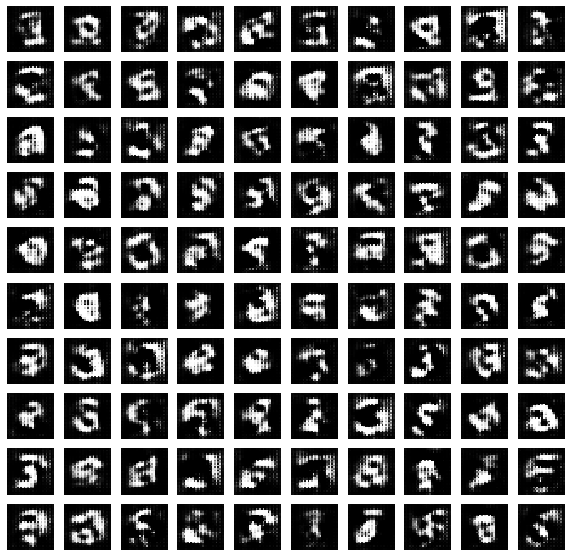

Time for epoch 4 is 9.65592336654663 sec


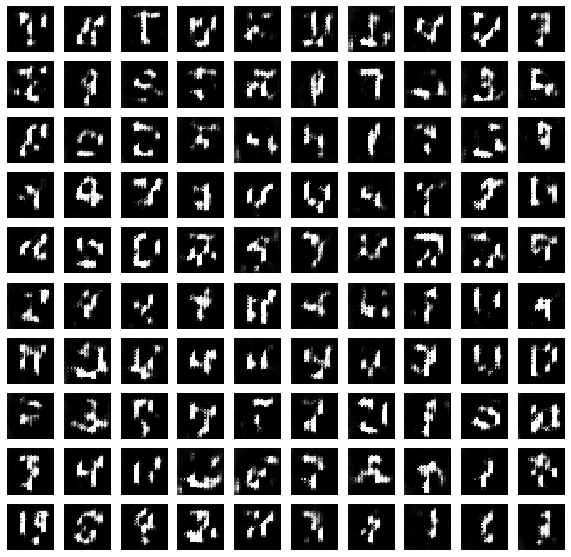

Time for epoch 5 is 9.496528148651123 sec


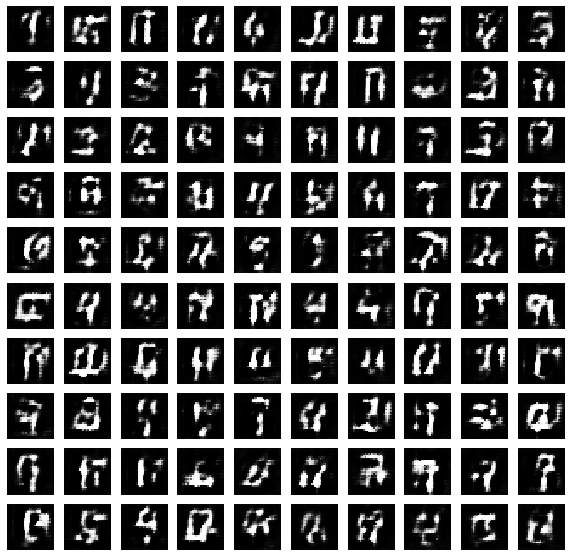

Time for epoch 6 is 9.606858491897583 sec


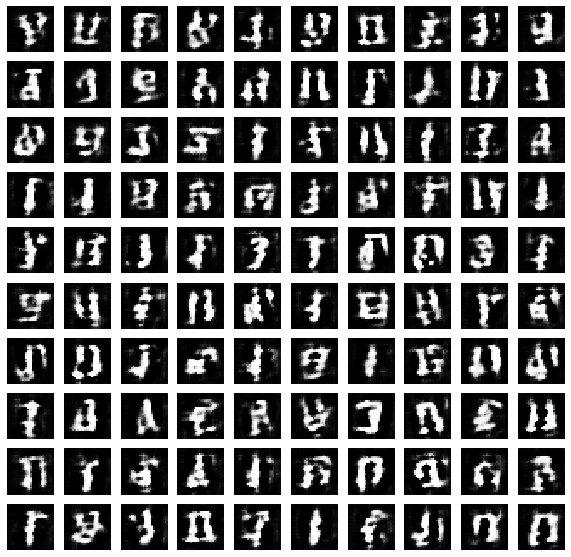

Time for epoch 7 is 9.544742345809937 sec


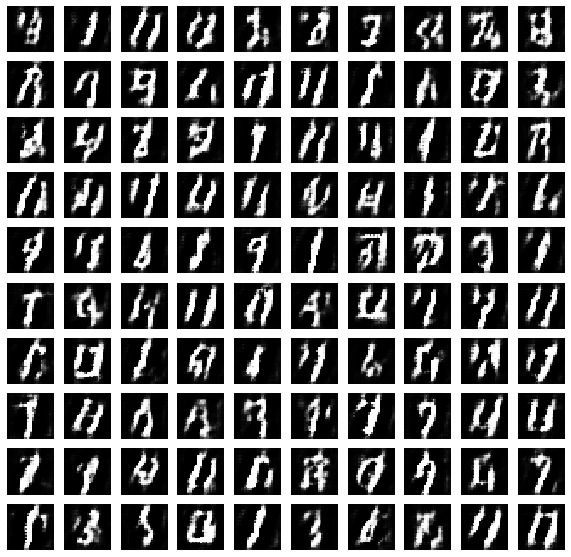

Time for epoch 8 is 9.585448503494263 sec


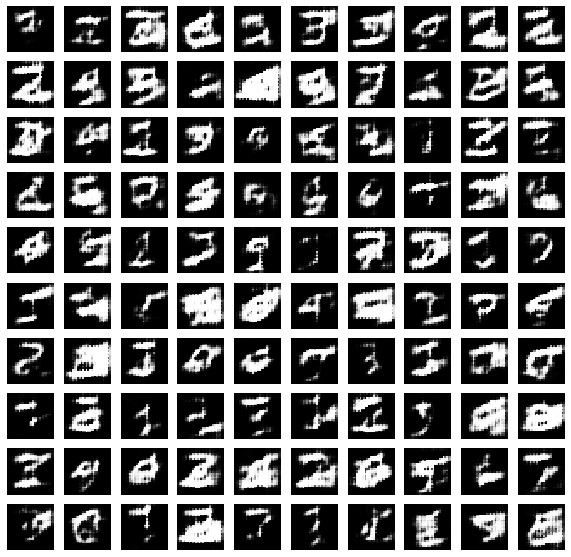

Time for epoch 9 is 9.478255987167358 sec


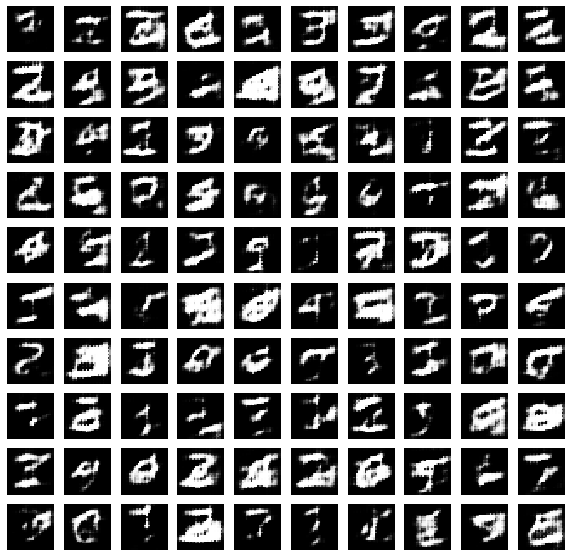

Time for epoch 10 is 9.617586851119995 sec


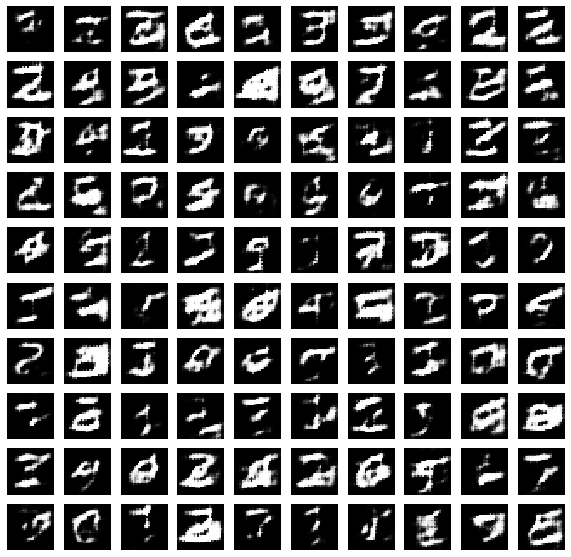

Time for epoch 11 is 9.458784341812134 sec


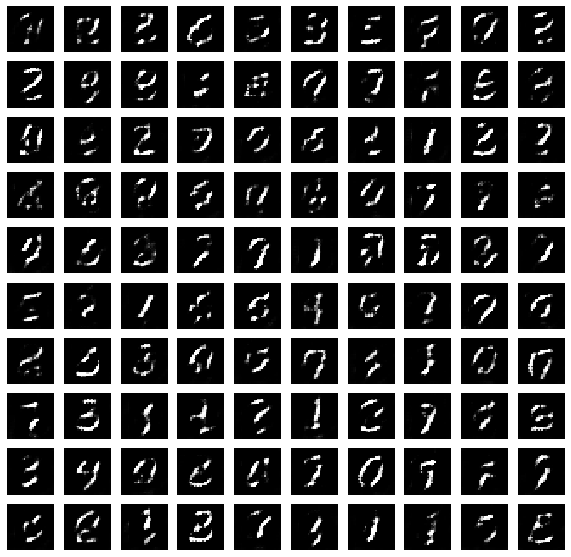

Time for epoch 12 is 9.6087007522583 sec


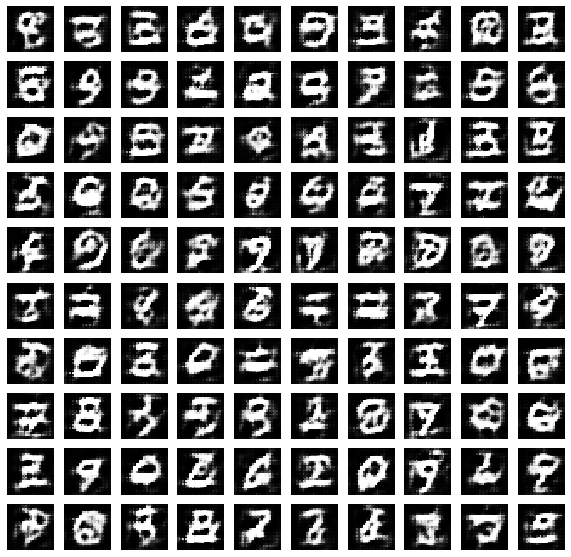

Time for epoch 13 is 9.50096321105957 sec


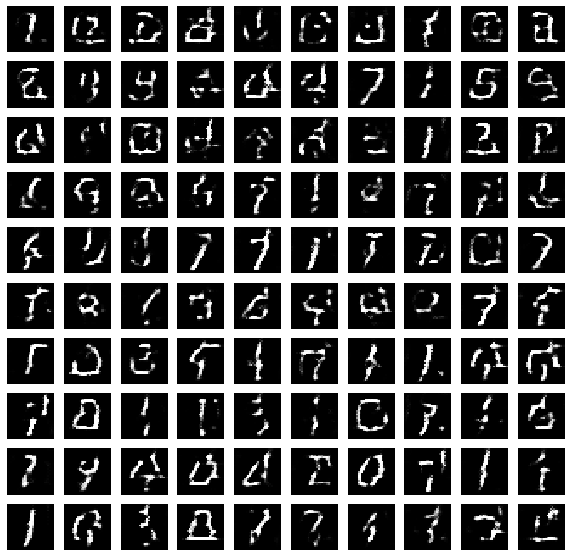

Time for epoch 14 is 9.611658811569214 sec


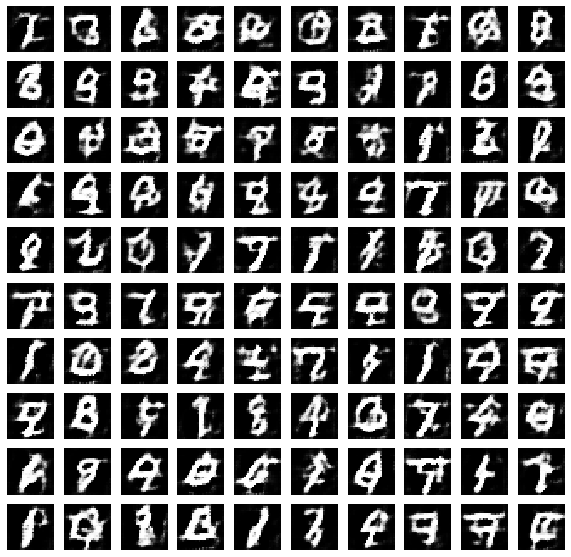

Time for epoch 15 is 9.457929849624634 sec


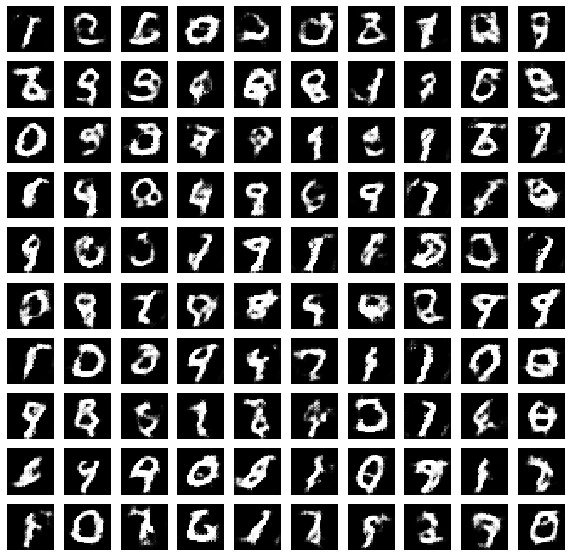

Time for epoch 16 is 9.63055419921875 sec


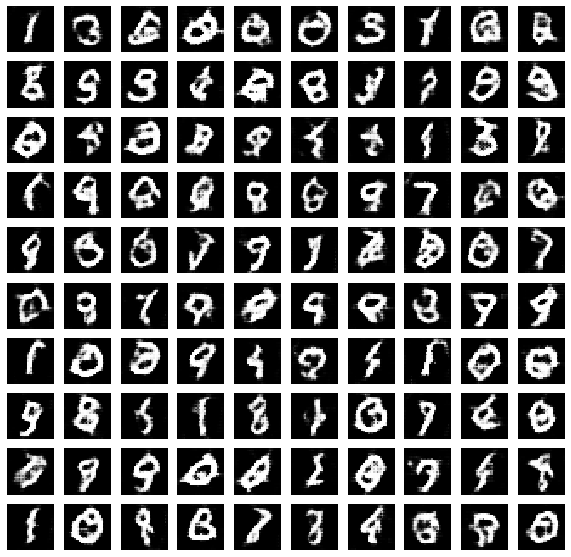

Time for epoch 17 is 9.492754220962524 sec


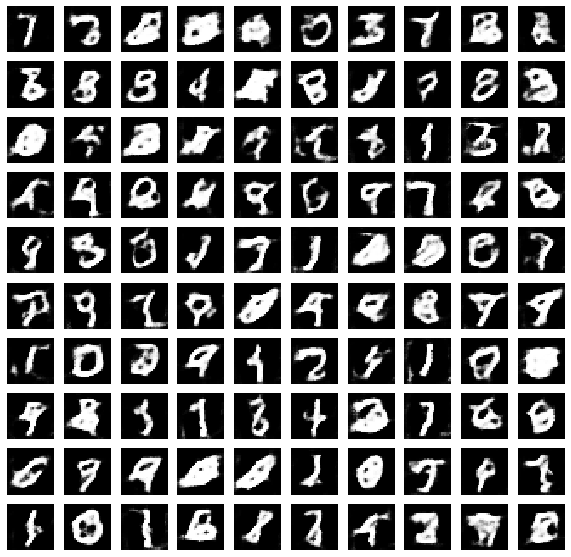

Time for epoch 18 is 9.586399793624878 sec


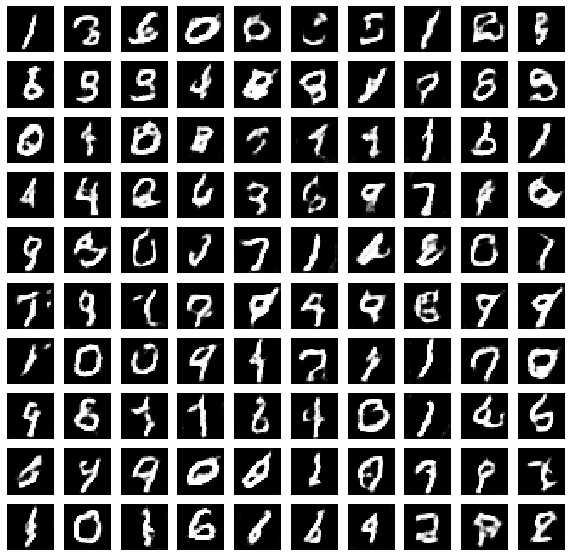

Time for epoch 19 is 9.453077793121338 sec


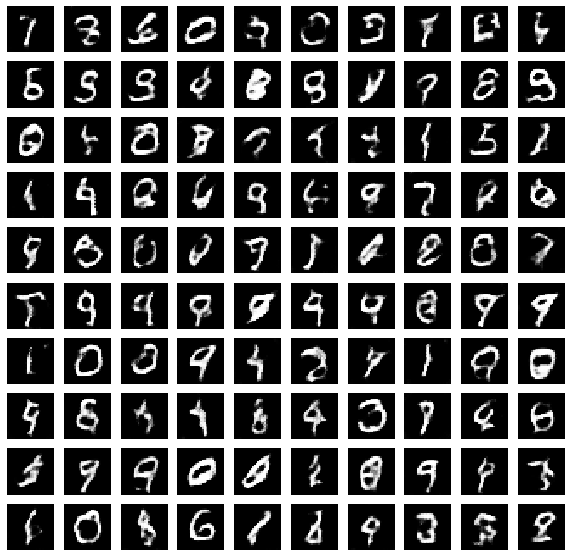

Time for epoch 20 is 9.558231592178345 sec


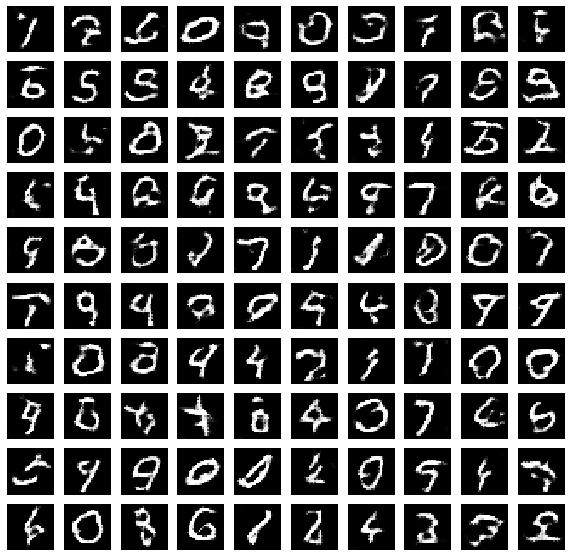

Time for epoch 21 is 9.436607837677002 sec


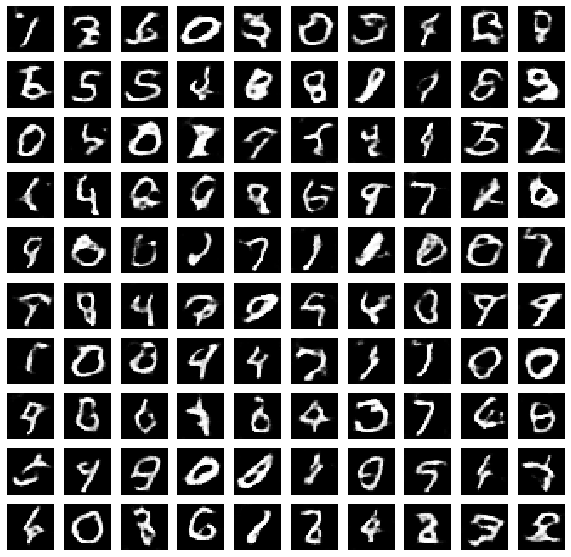

Time for epoch 22 is 9.63064956665039 sec


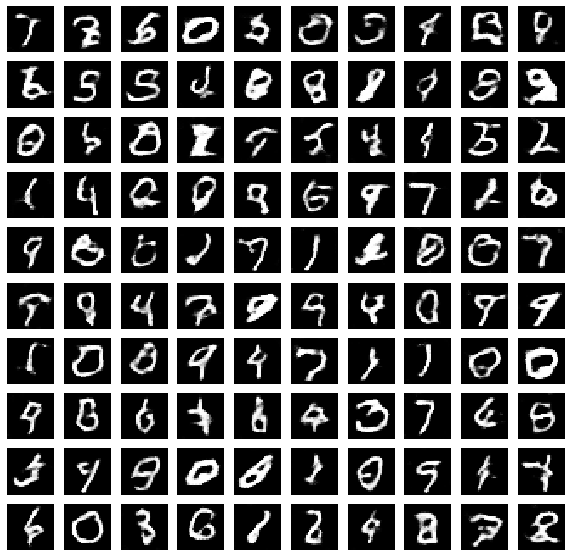

Time for epoch 23 is 9.531471729278564 sec


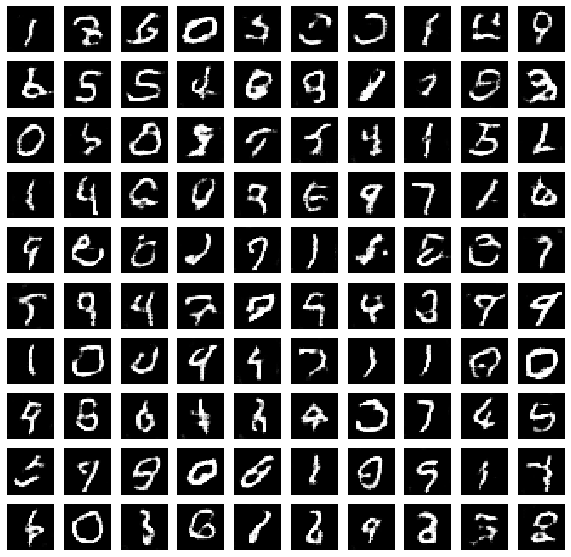

Time for epoch 24 is 9.609479904174805 sec


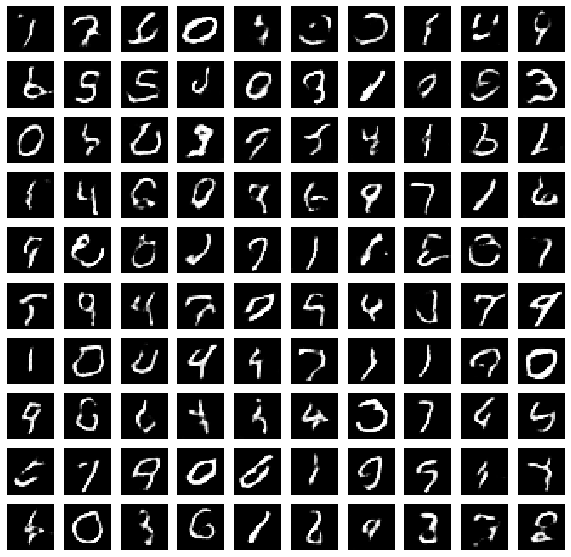

Time for epoch 25 is 9.450984477996826 sec


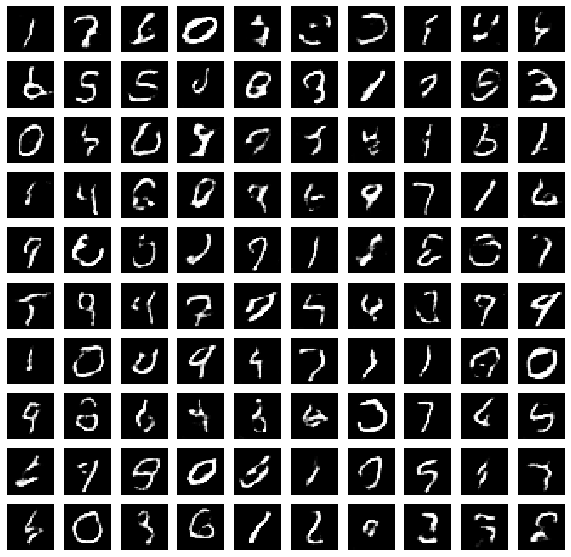

Time for epoch 26 is 9.543636798858643 sec


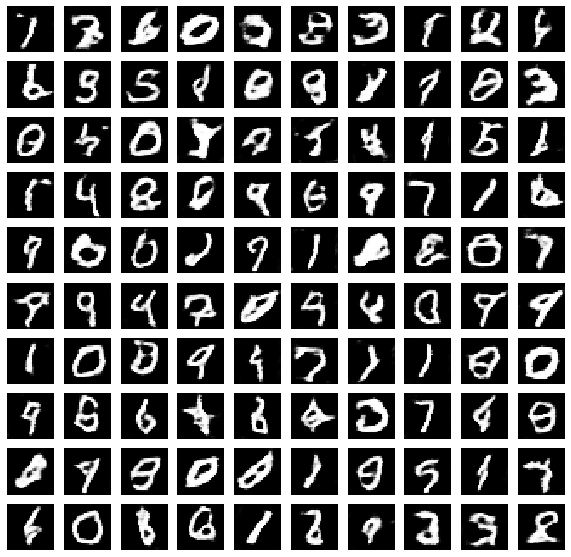

Time for epoch 27 is 9.44303274154663 sec


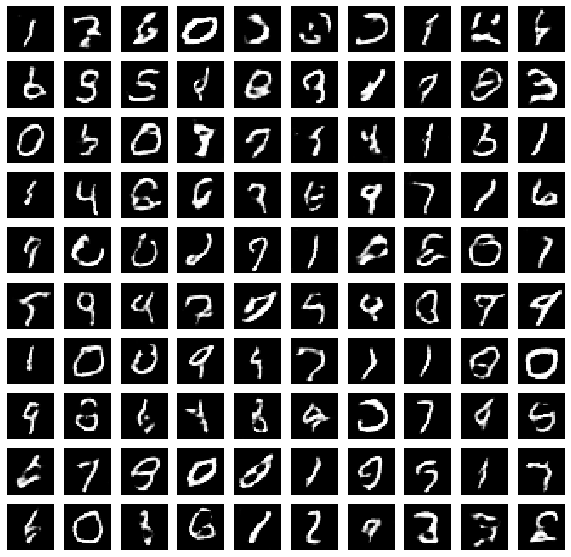

Time for epoch 28 is 9.556426048278809 sec


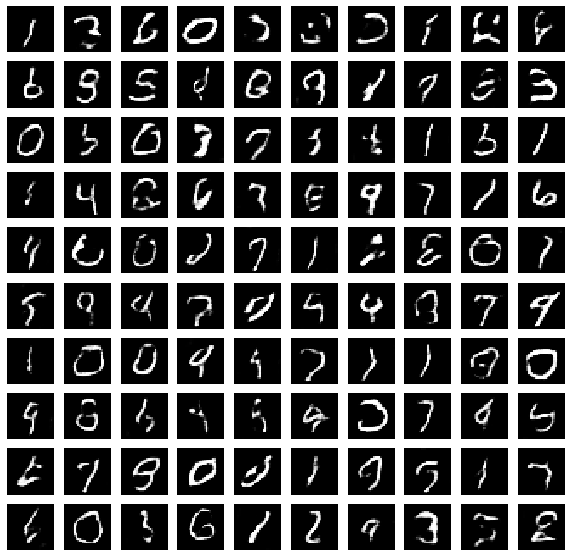

Time for epoch 29 is 9.369872808456421 sec


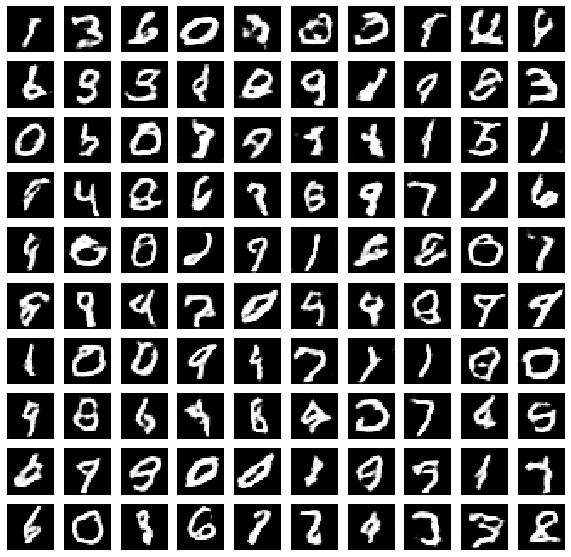

Time for epoch 30 is 9.516643762588501 sec


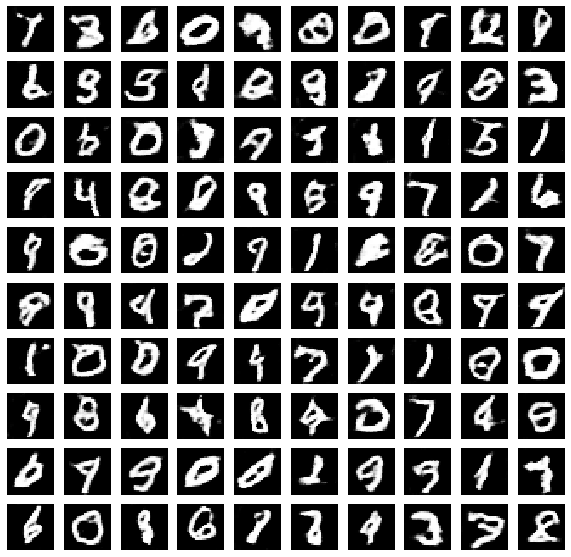

Time for epoch 31 is 9.3949875831604 sec


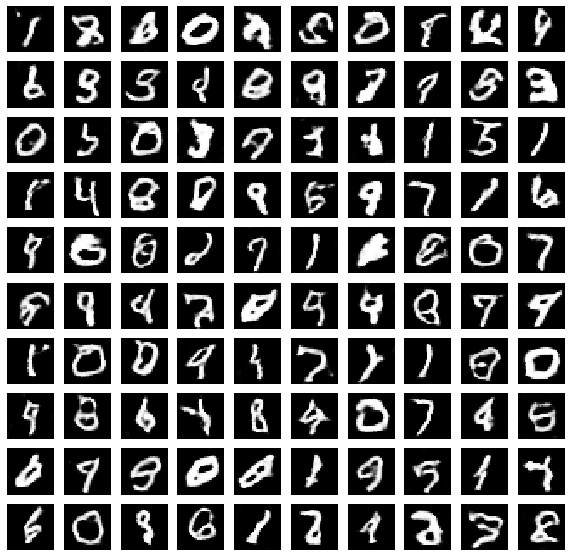

Time for epoch 32 is 9.55238652229309 sec


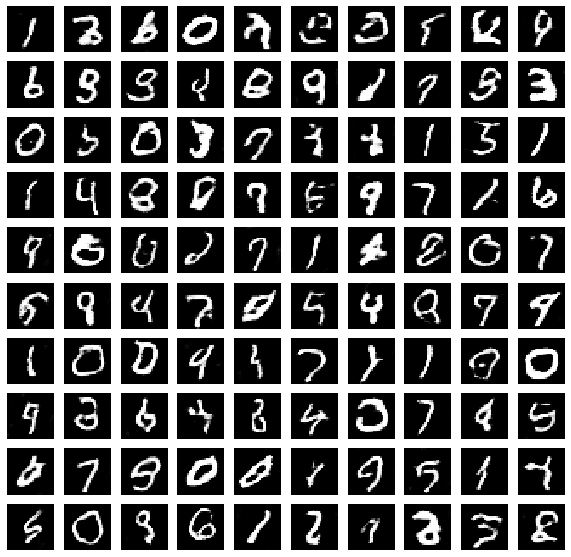

Time for epoch 33 is 9.430790662765503 sec


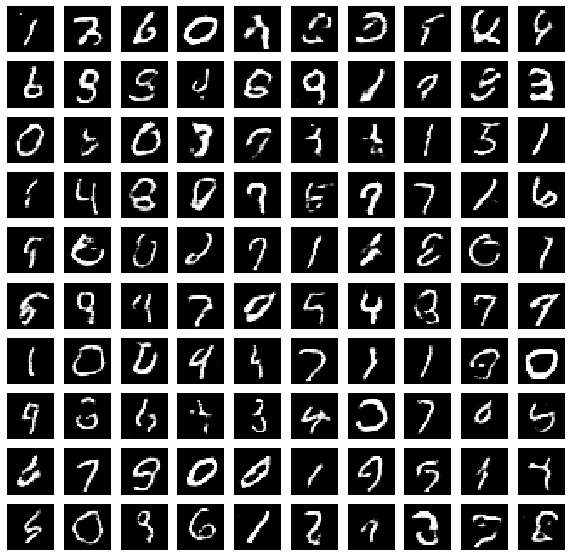

Time for epoch 34 is 9.51001763343811 sec


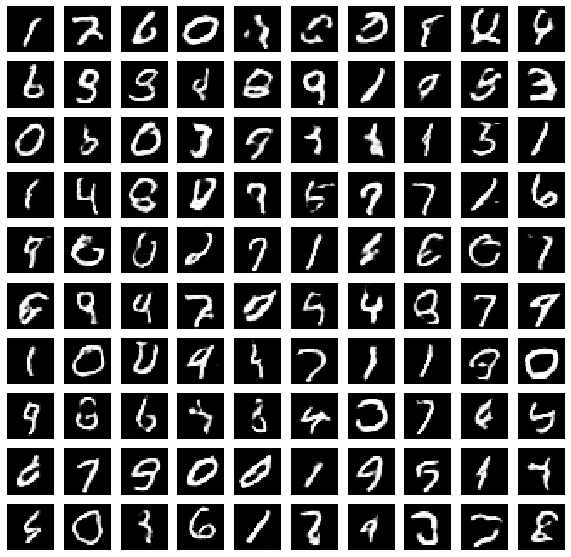

Time for epoch 35 is 9.392288446426392 sec


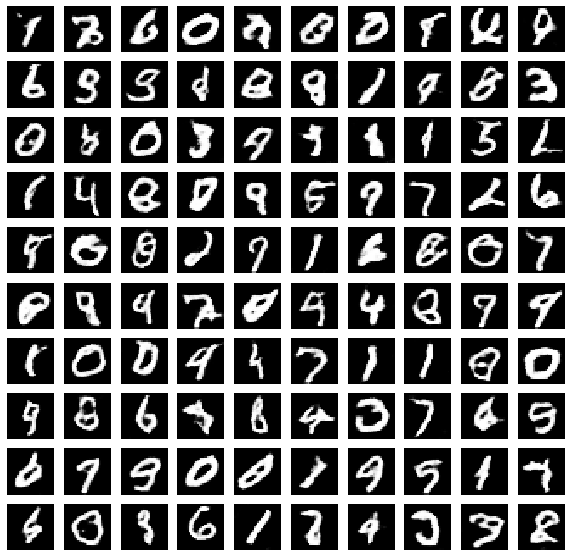

Time for epoch 36 is 9.551589250564575 sec


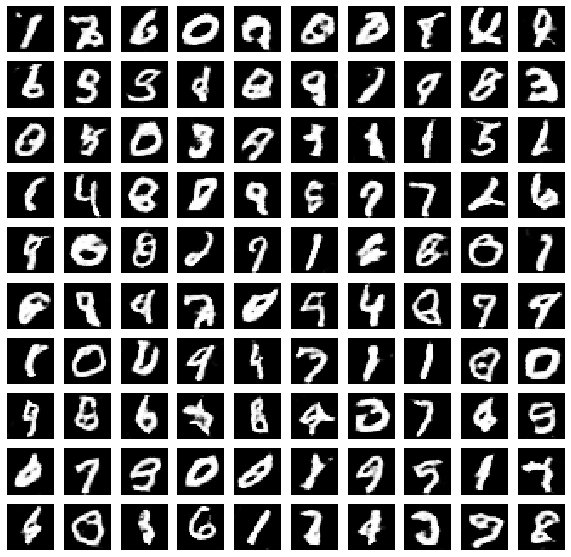

Time for epoch 37 is 9.439857006072998 sec


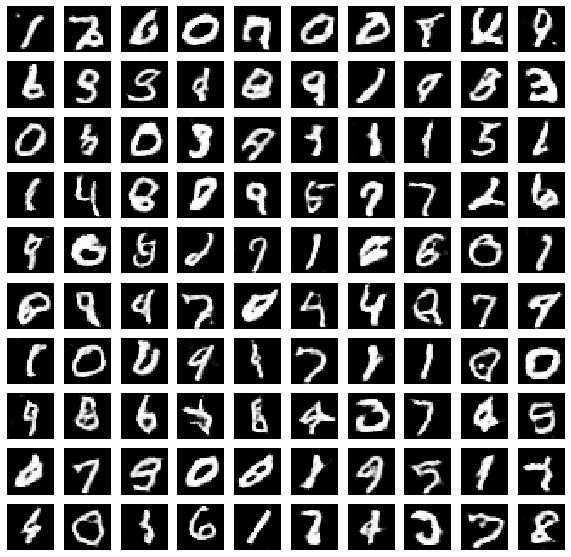

Time for epoch 38 is 9.487120389938354 sec


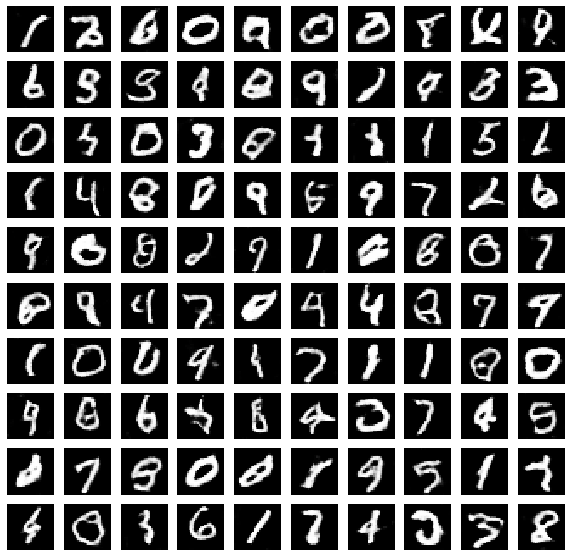

Time for epoch 39 is 9.359191179275513 sec


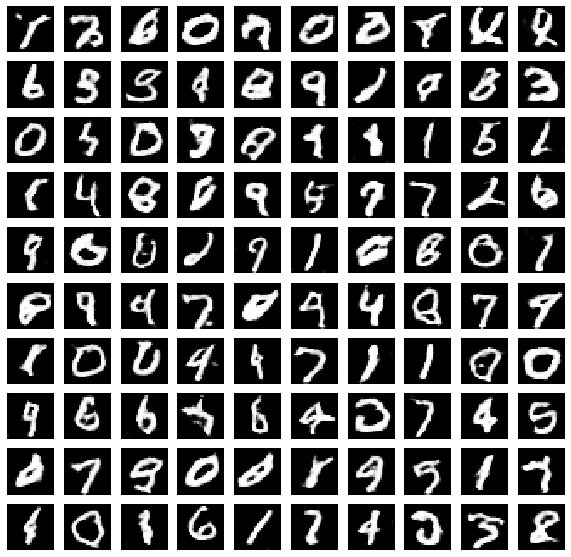

Time for epoch 40 is 9.548930168151855 sec


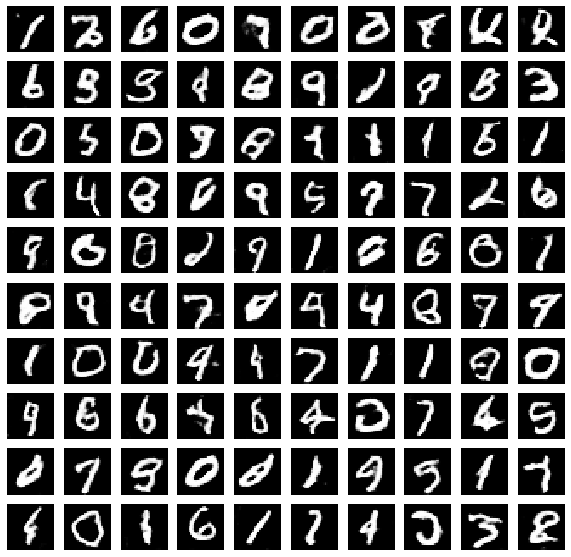

Time for epoch 41 is 9.360190391540527 sec


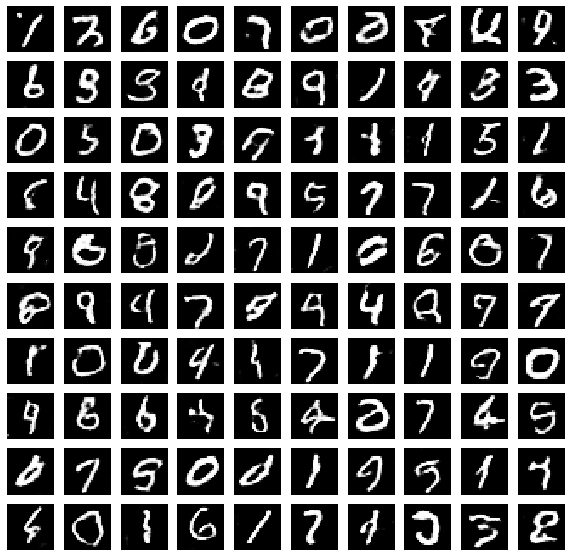

Time for epoch 42 is 9.50505781173706 sec


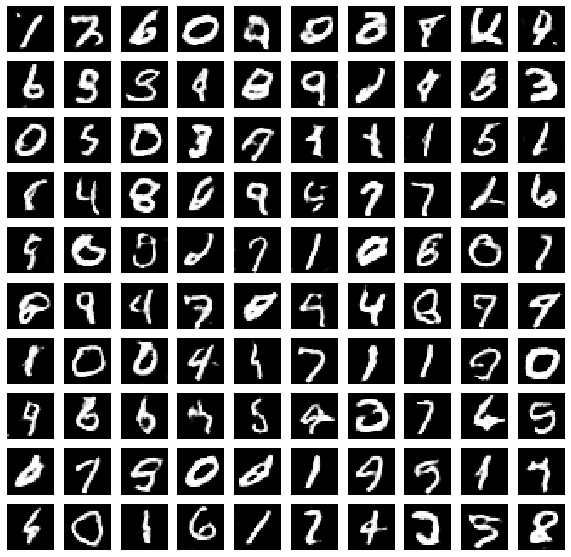

Time for epoch 43 is 9.375441312789917 sec


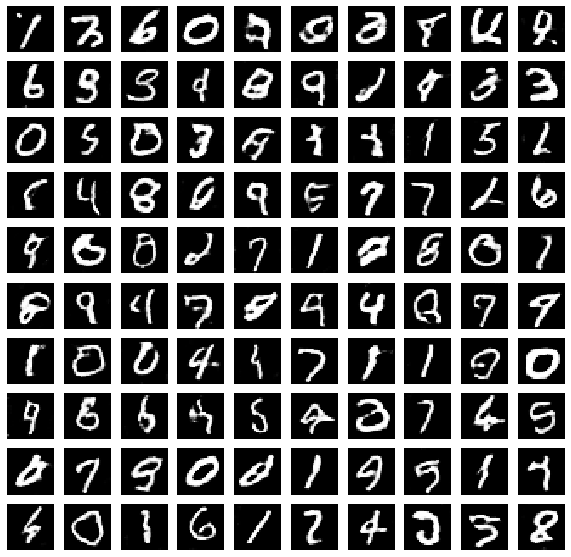

Time for epoch 44 is 9.522742986679077 sec


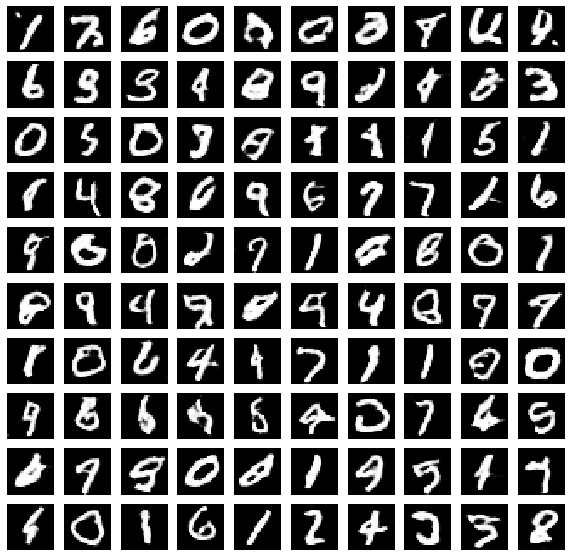

Time for epoch 45 is 9.360649108886719 sec


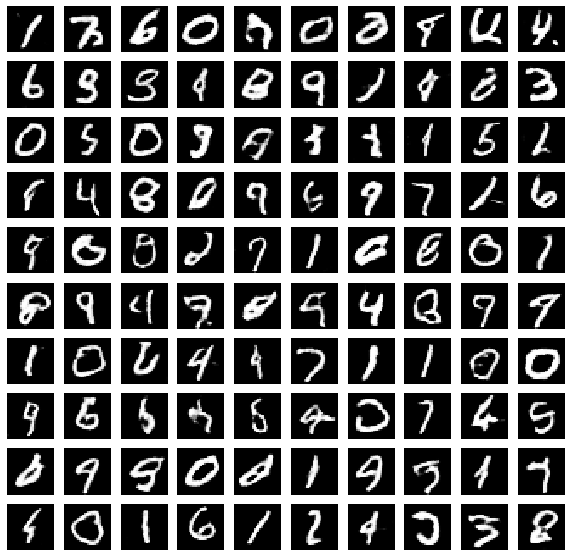

Time for epoch 46 is 9.49636435508728 sec


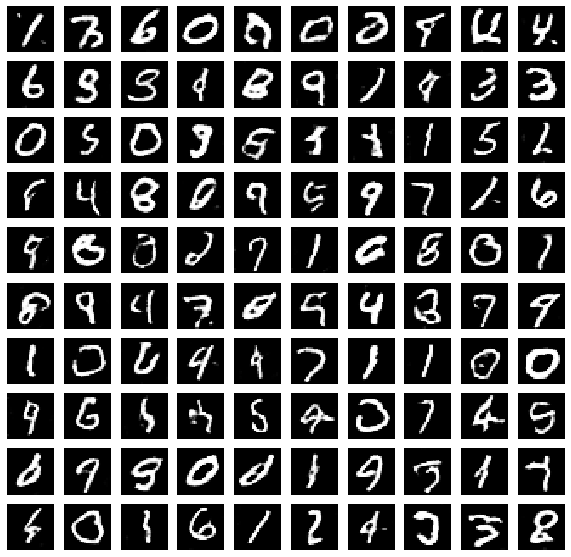

Time for epoch 47 is 9.384186506271362 sec


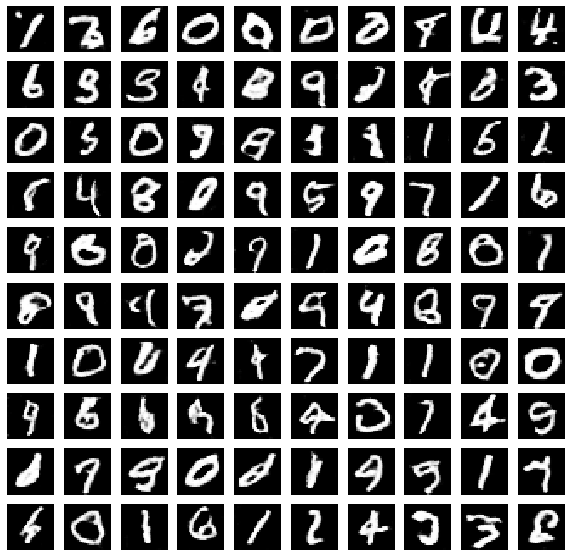

Time for epoch 48 is 9.513881206512451 sec


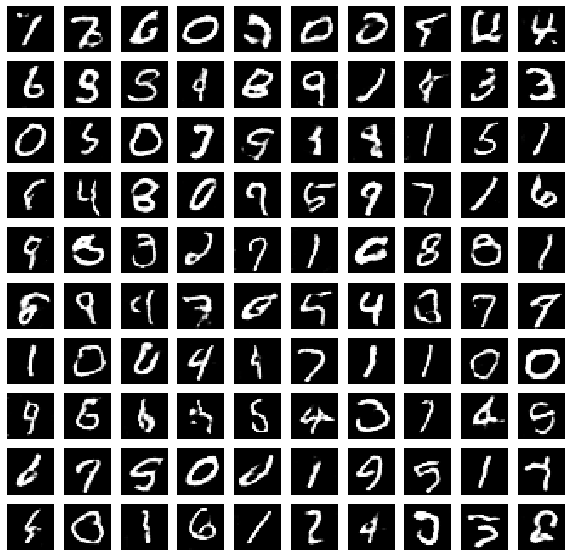

Time for epoch 49 is 9.346340417861938 sec


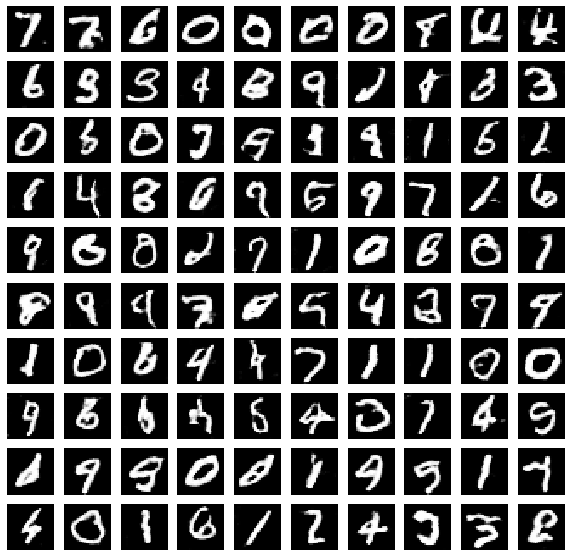

Time for epoch 50 is 9.493325471878052 sec


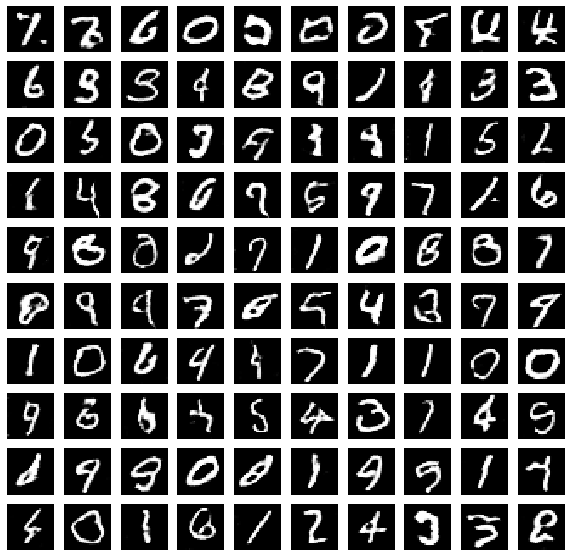

Time for epoch 51 is 9.340890884399414 sec


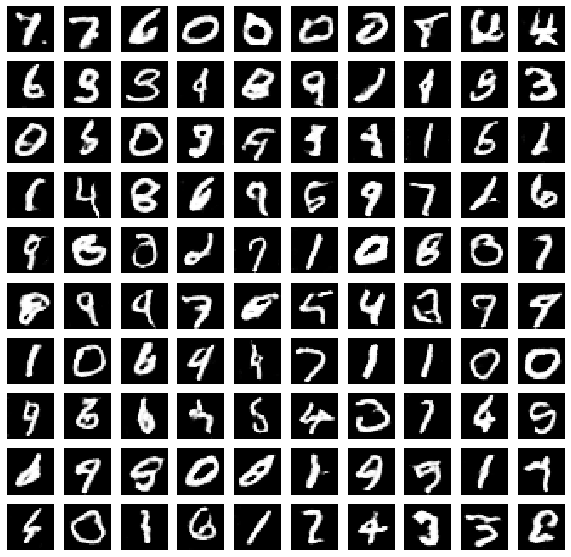

Time for epoch 52 is 9.537515878677368 sec


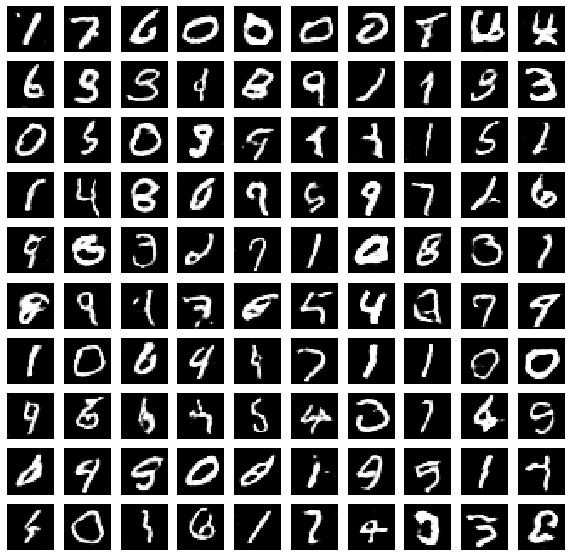

Time for epoch 53 is 9.353520631790161 sec


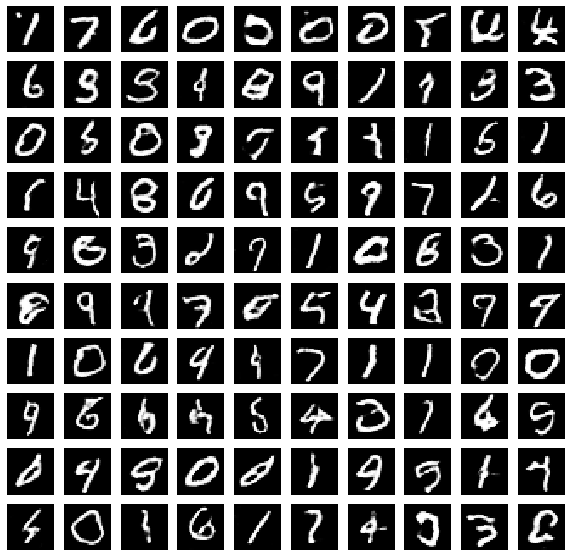

Time for epoch 54 is 9.502403974533081 sec


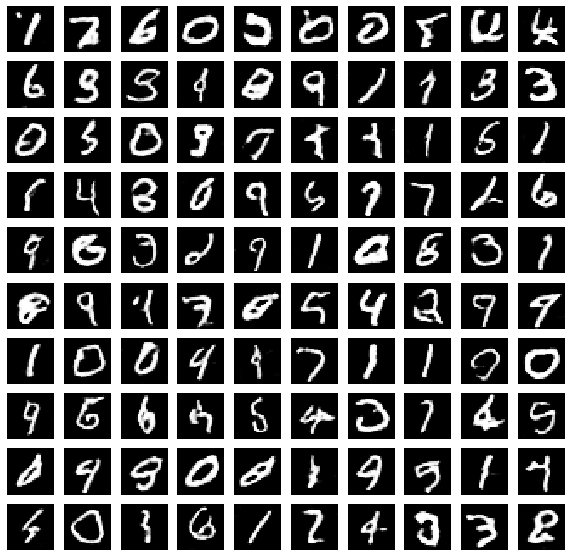

Time for epoch 55 is 9.398090362548828 sec


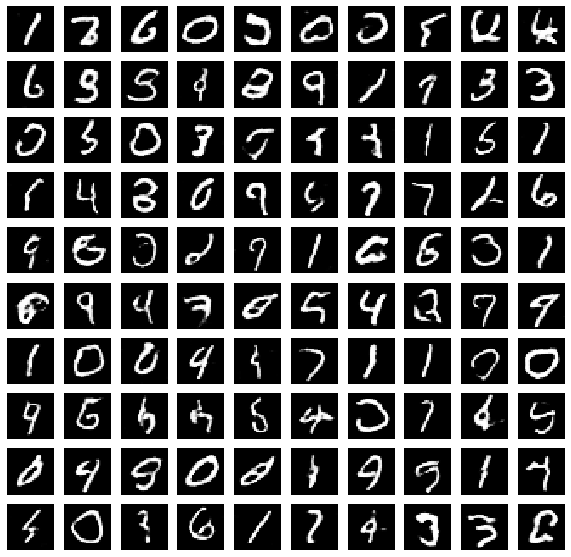

Time for epoch 56 is 9.538453340530396 sec


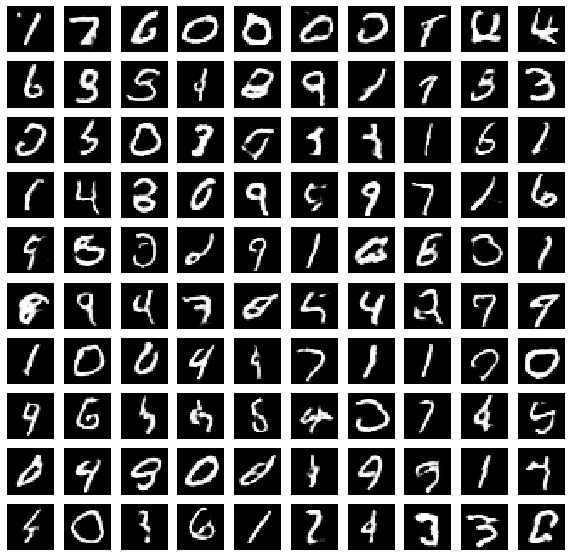

Time for epoch 57 is 9.393477439880371 sec


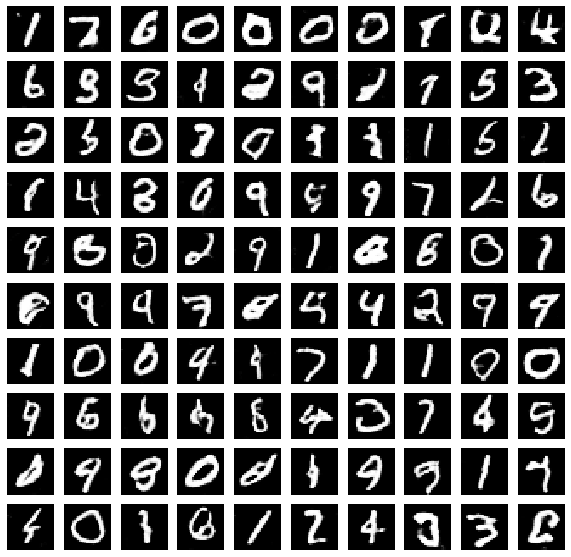

Time for epoch 58 is 9.448506832122803 sec


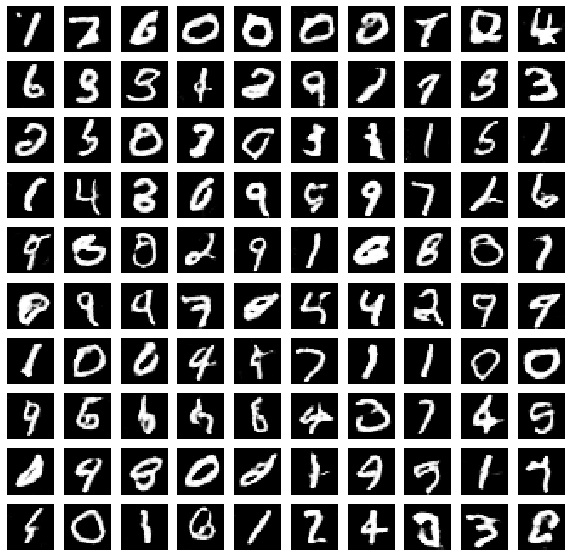

Time for epoch 59 is 9.35646677017212 sec


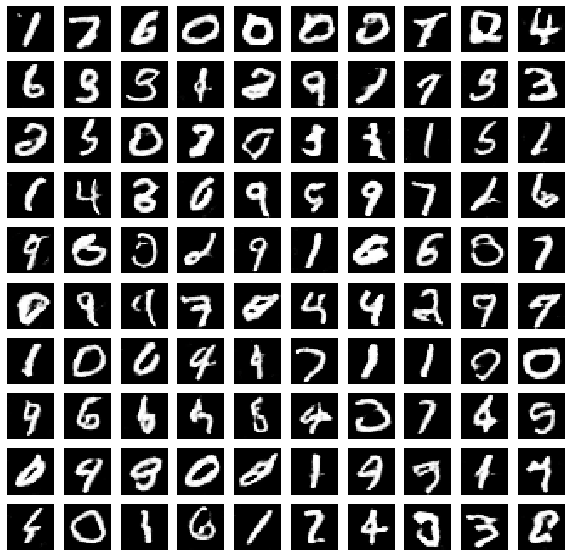

Time for epoch 60 is 9.485158920288086 sec


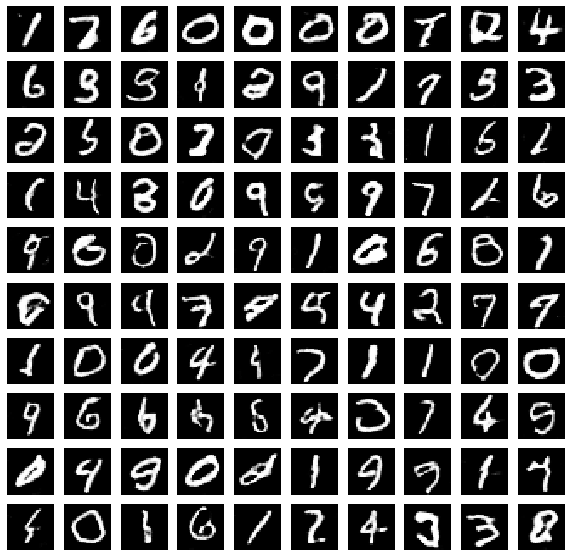

Time for epoch 61 is 9.329931259155273 sec


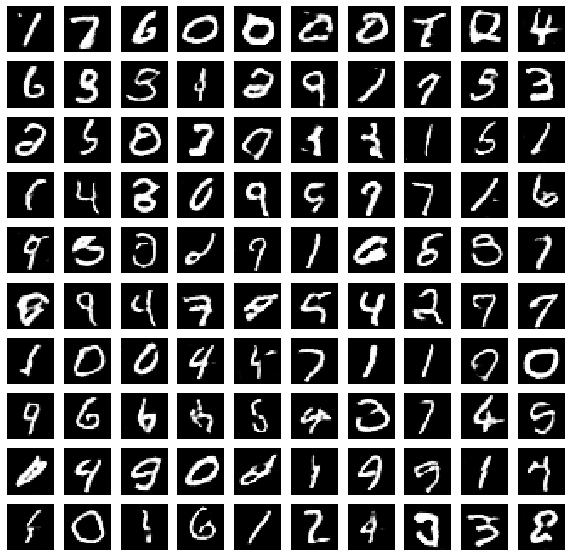

Time for epoch 62 is 9.479365348815918 sec


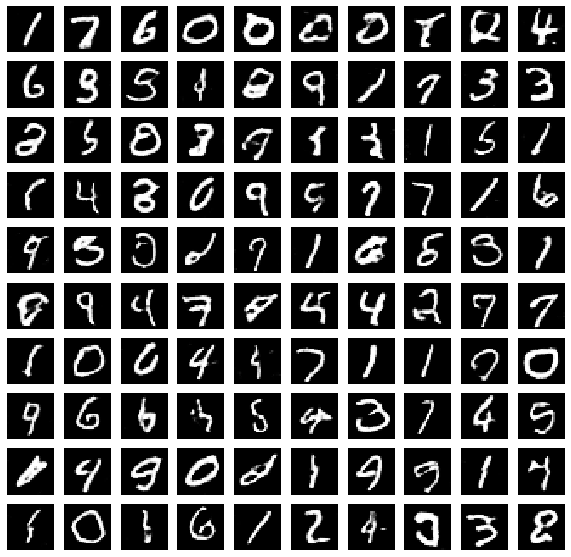

Time for epoch 63 is 9.316053867340088 sec


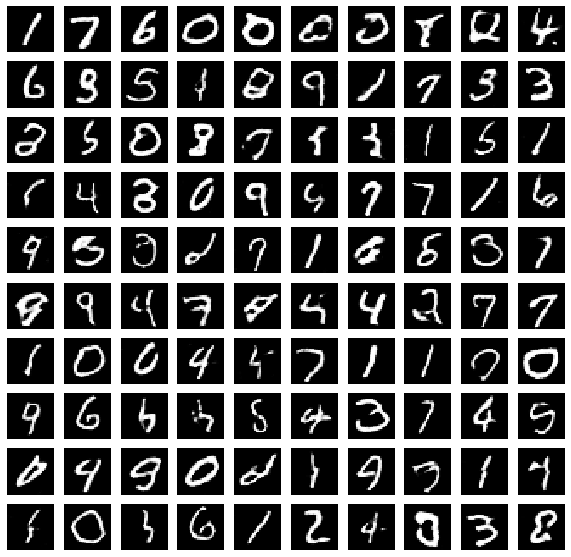

Time for epoch 64 is 9.474547147750854 sec


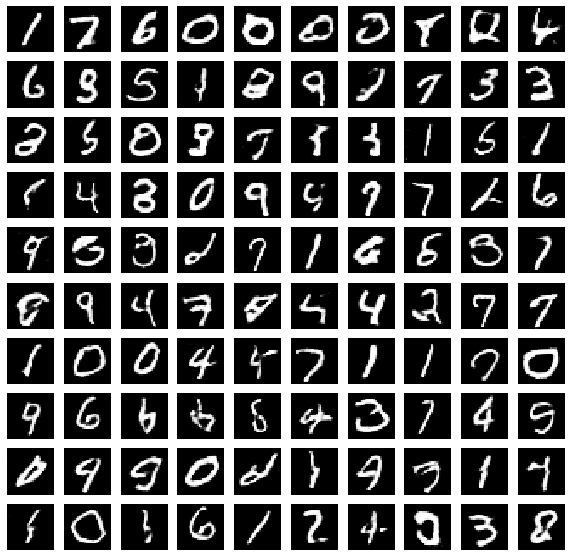

Time for epoch 65 is 9.30795431137085 sec


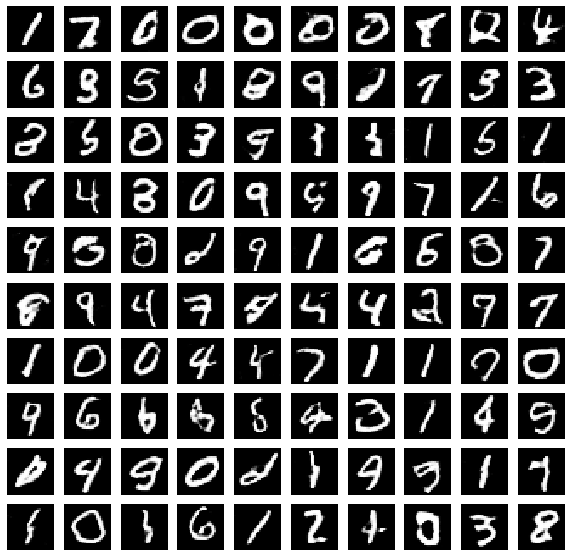

Time for epoch 66 is 9.442024946212769 sec


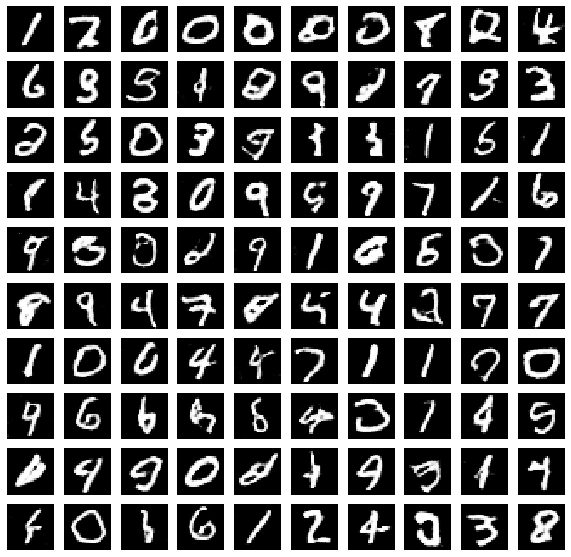

Time for epoch 67 is 9.416627883911133 sec


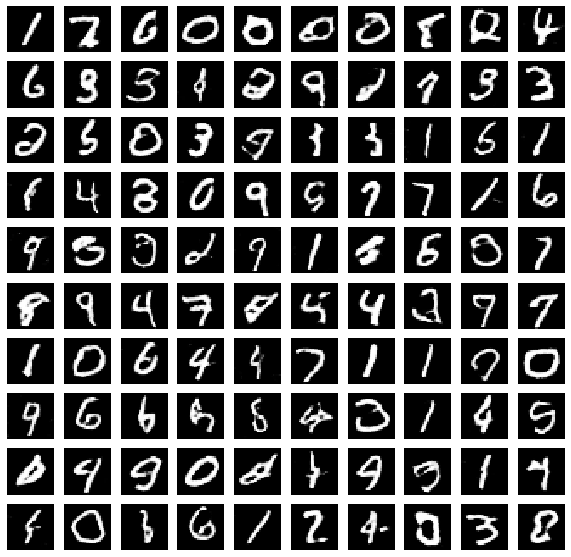

Time for epoch 68 is 9.488107681274414 sec


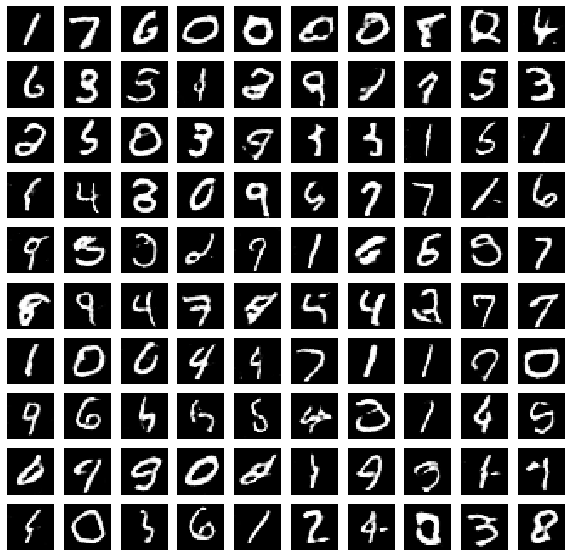

Time for epoch 69 is 9.334434986114502 sec


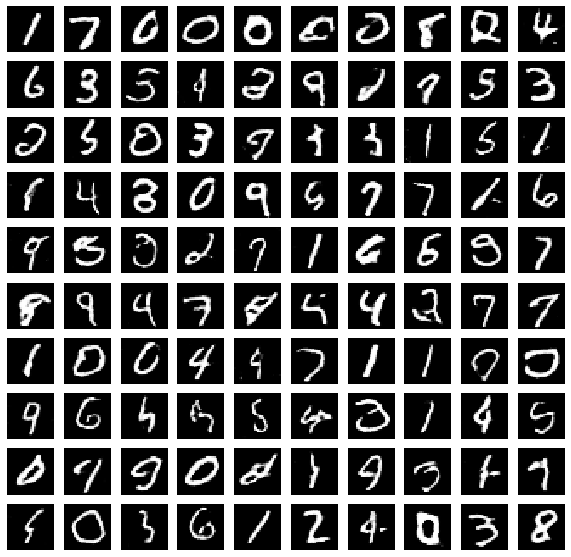

Time for epoch 70 is 9.482369184494019 sec


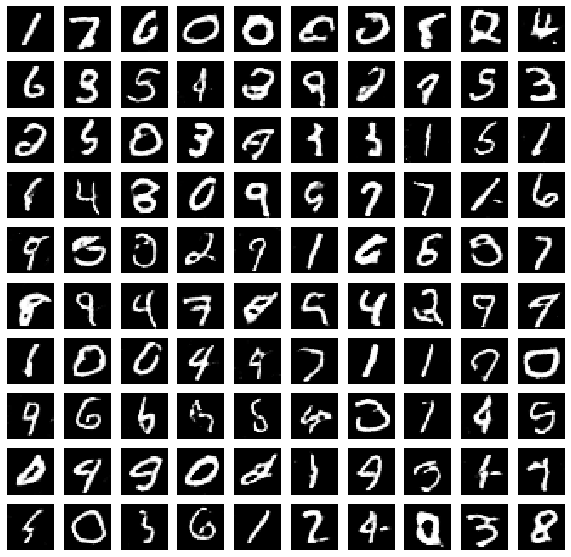

Time for epoch 71 is 9.356913089752197 sec


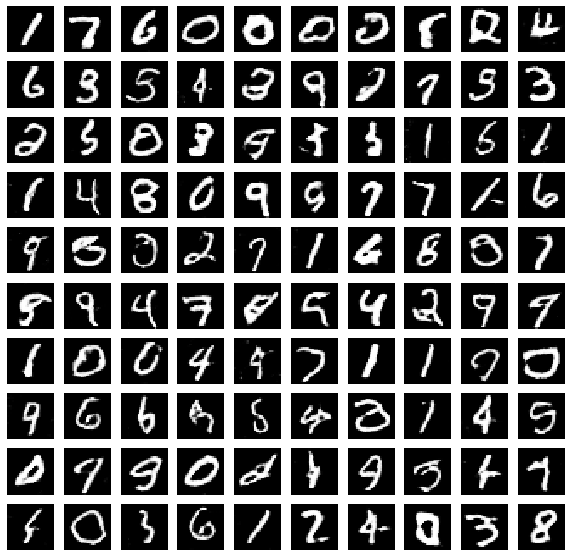

Time for epoch 72 is 9.462928533554077 sec


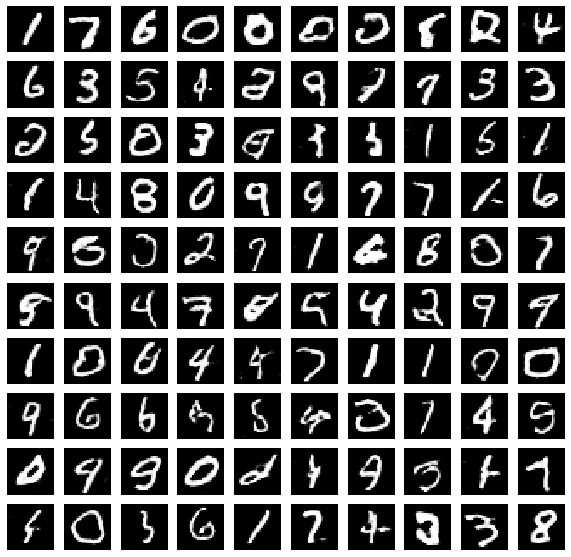

Time for epoch 73 is 9.319678783416748 sec


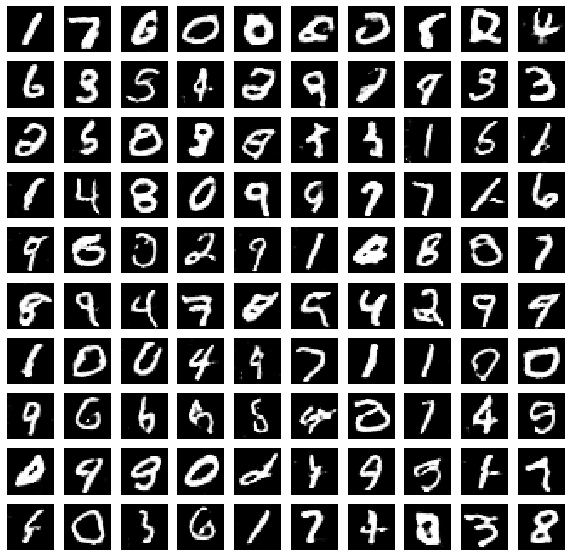

Time for epoch 74 is 9.447294473648071 sec


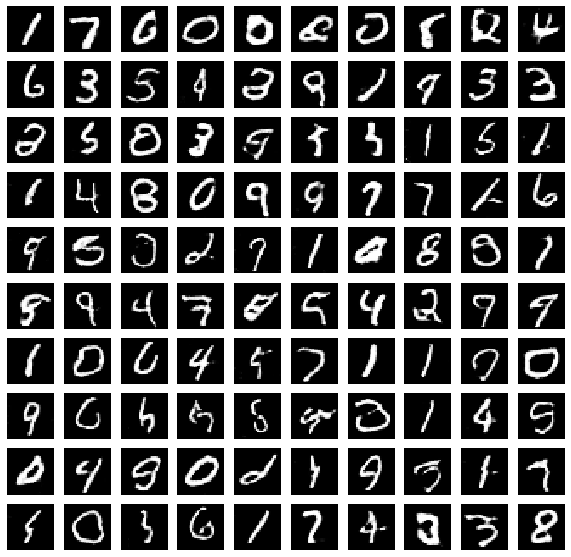

Time for epoch 75 is 9.353417158126831 sec


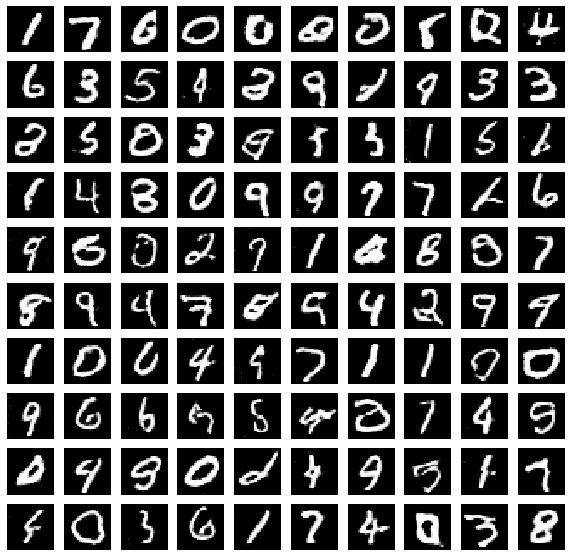

Time for epoch 76 is 9.434308290481567 sec


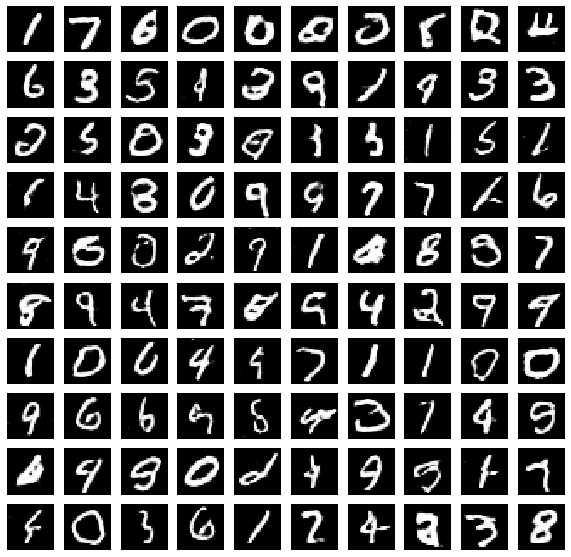

Time for epoch 77 is 9.352705478668213 sec


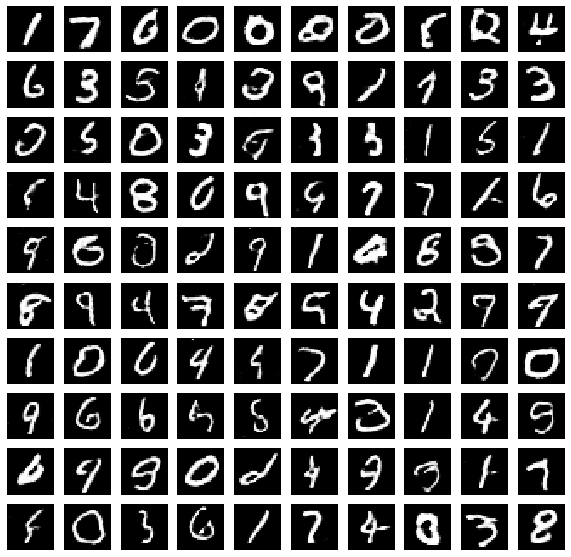

Time for epoch 78 is 9.46582841873169 sec


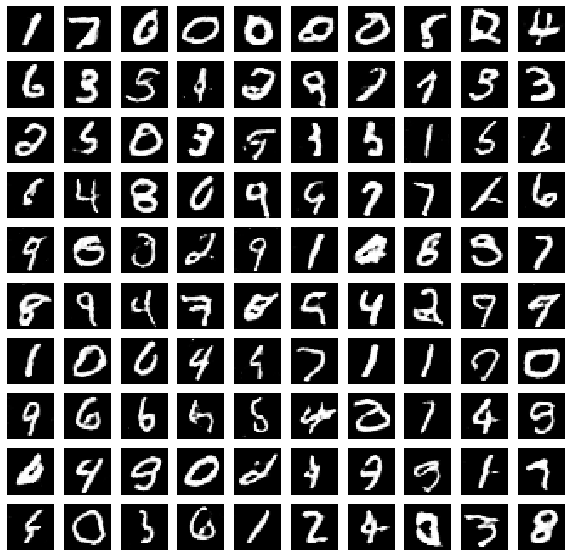

Time for epoch 79 is 9.30701994895935 sec


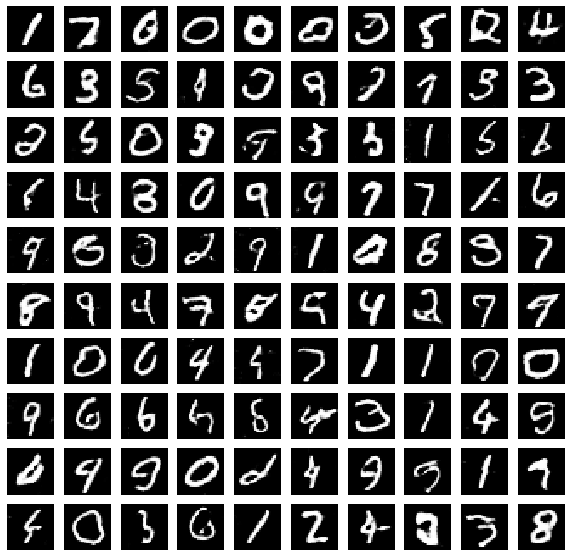

Time for epoch 80 is 9.432560205459595 sec


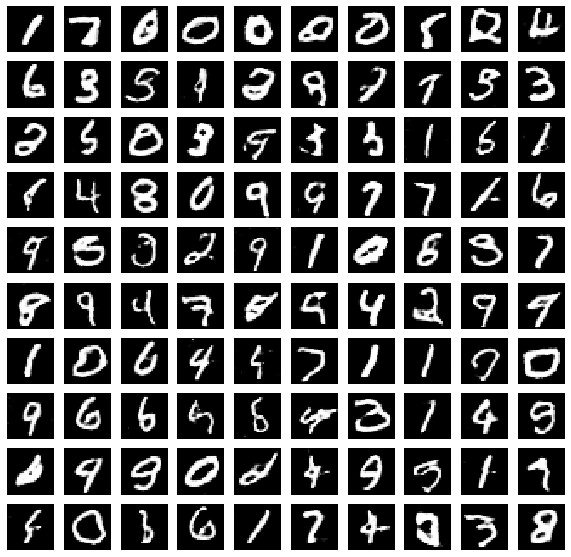

Time for epoch 81 is 9.35130000114441 sec


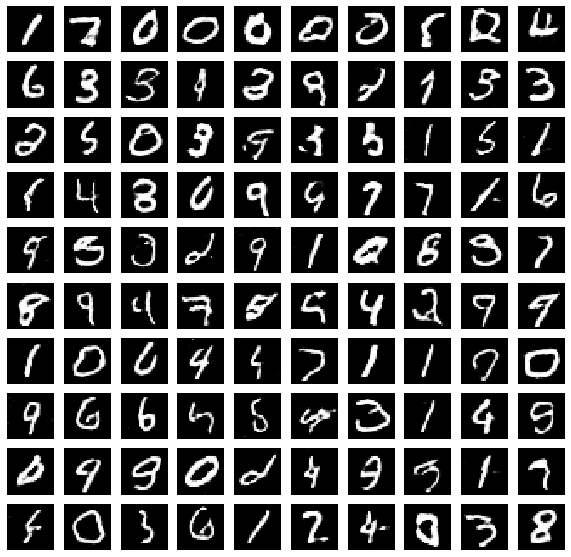

Time for epoch 82 is 9.449025869369507 sec


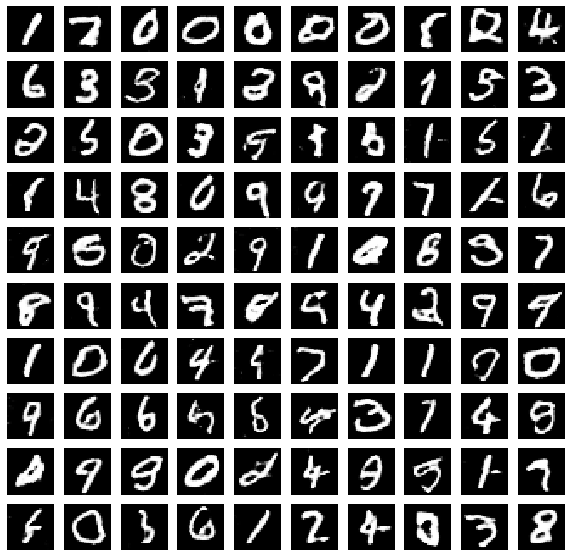

Time for epoch 83 is 9.366861581802368 sec


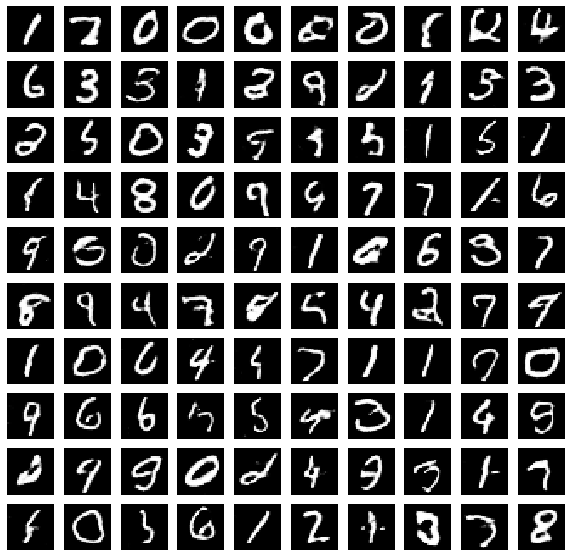

Time for epoch 84 is 9.446938514709473 sec


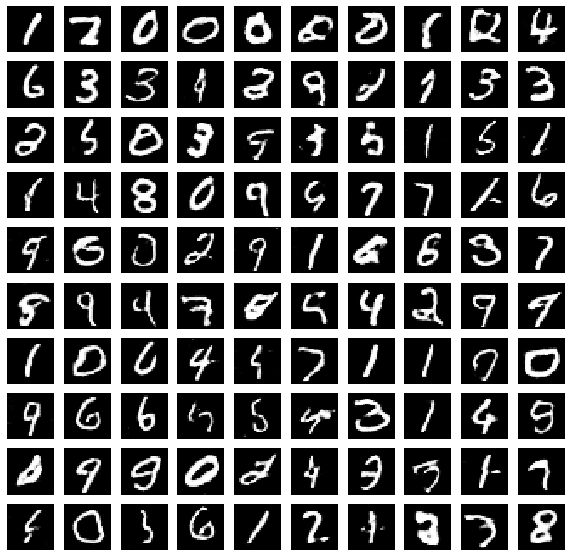

Time for epoch 85 is 9.334556579589844 sec


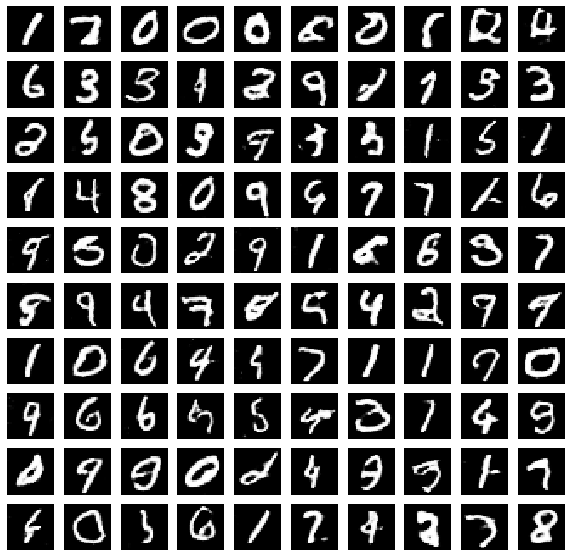

Time for epoch 86 is 9.482473134994507 sec


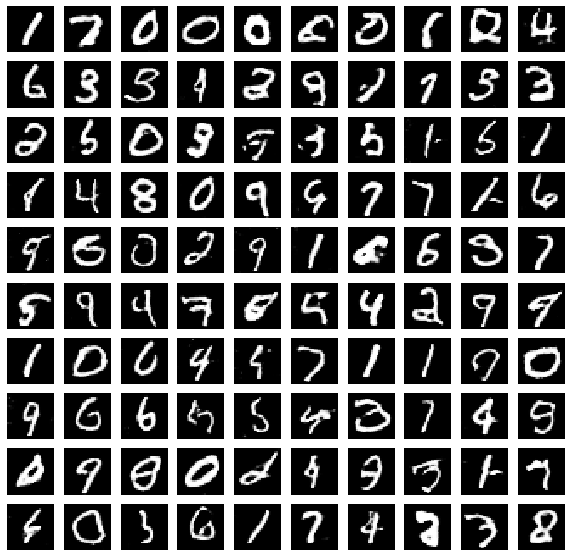

Time for epoch 87 is 9.421027660369873 sec


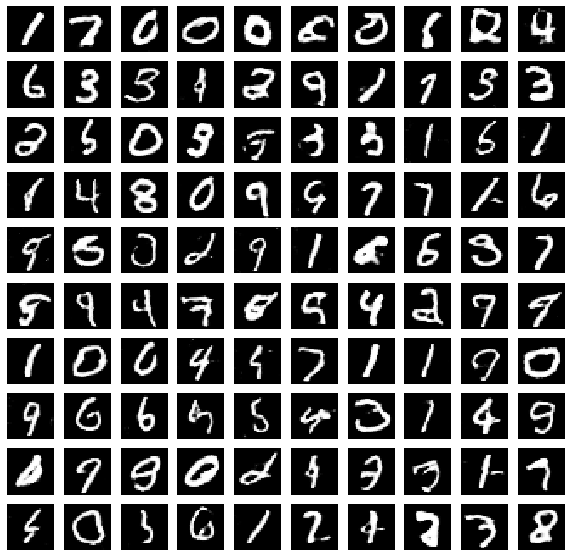

Time for epoch 88 is 9.422057151794434 sec


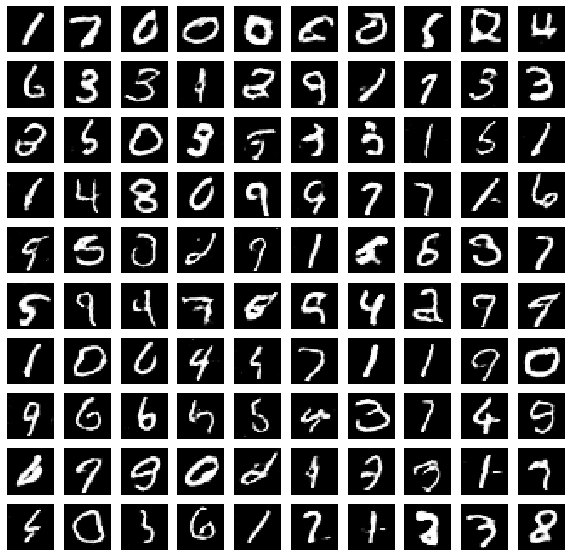

Time for epoch 89 is 9.35831904411316 sec


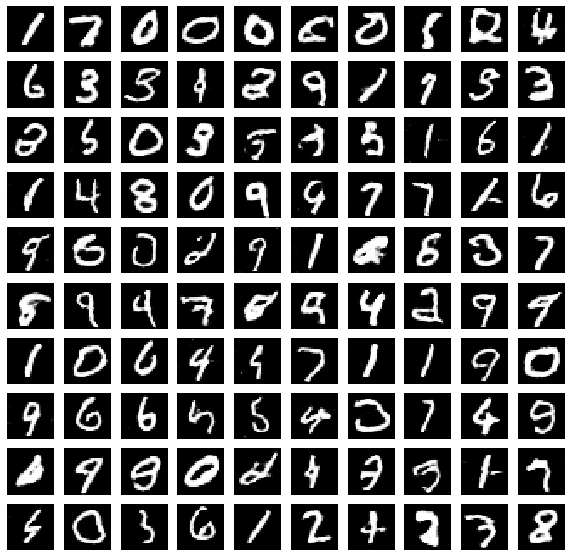

Time for epoch 90 is 9.448561906814575 sec


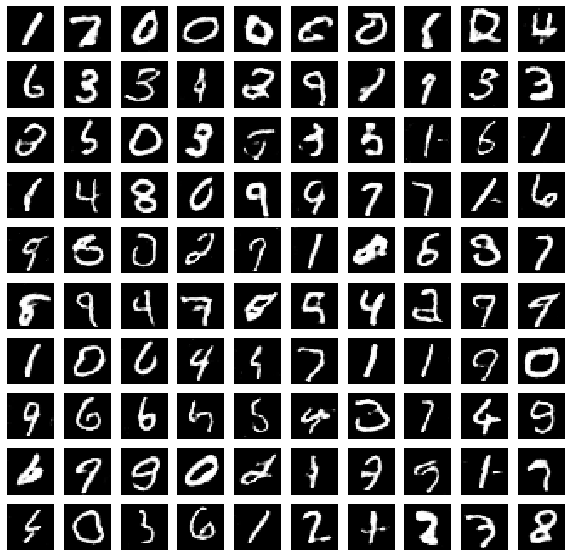

Time for epoch 91 is 9.322558879852295 sec


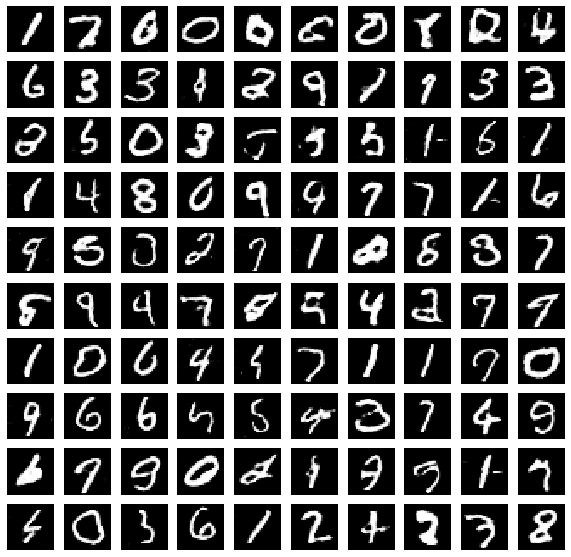

Time for epoch 92 is 9.431270599365234 sec


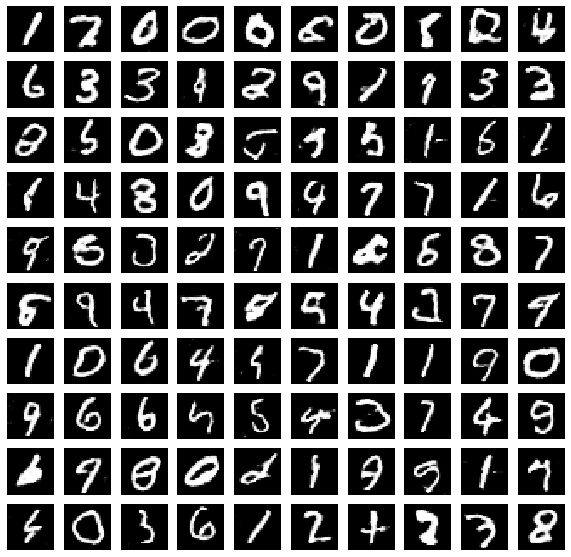

Time for epoch 93 is 9.312048435211182 sec


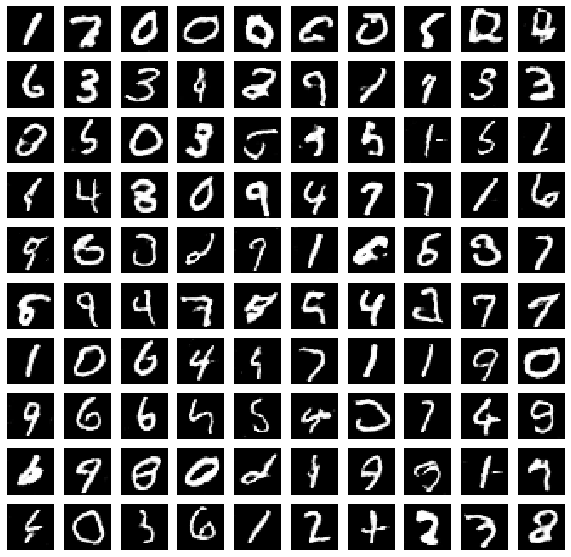

Time for epoch 94 is 9.560541152954102 sec


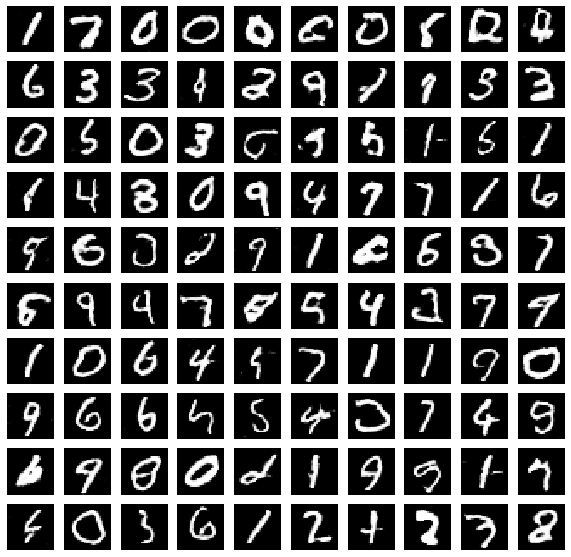

Time for epoch 95 is 9.340264320373535 sec


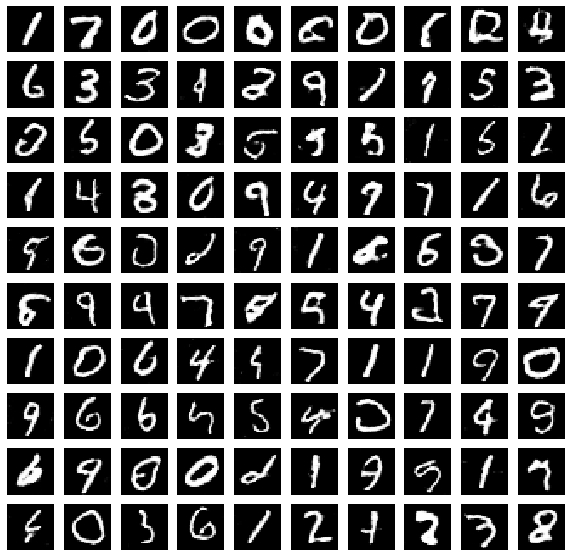

Time for epoch 96 is 9.530032873153687 sec


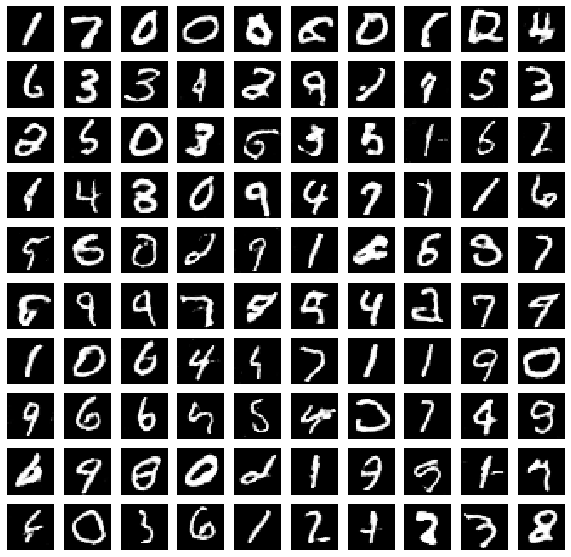

Time for epoch 97 is 9.480273485183716 sec


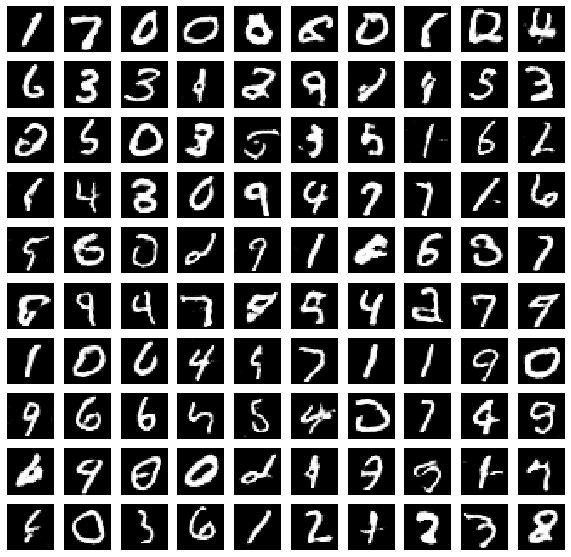

Time for epoch 98 is 9.583067178726196 sec


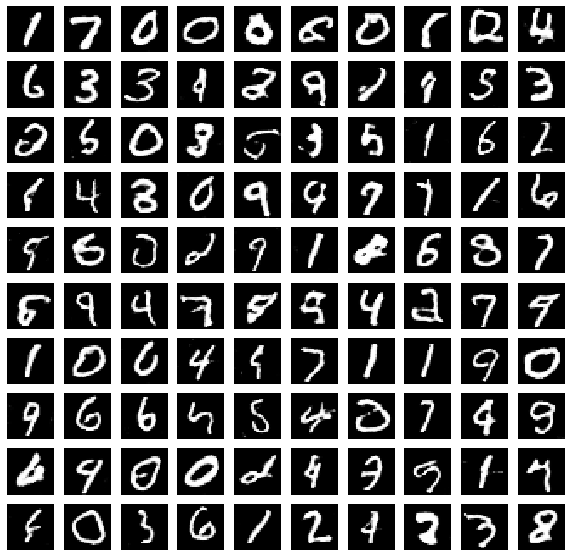

Time for epoch 99 is 9.427118062973022 sec


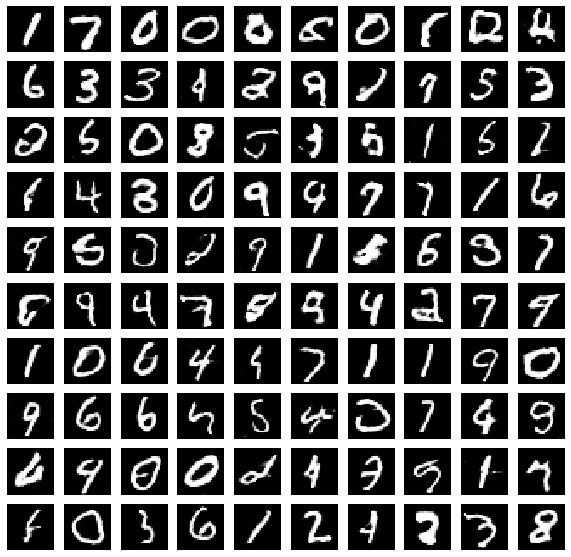

Time for epoch 100 is 9.54751443862915 sec


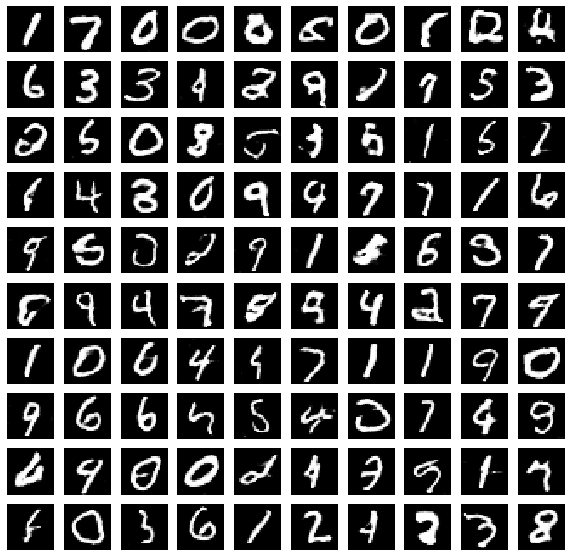

In [18]:
## %%time
EPOCHS = 100
train(train_dataset, EPOCHS)